# Investigating A VIX Trading Signal

## Python Imports

In [1]:
# Standard Library
import datetime
import io
import os
import random
import sys
import warnings

from datetime import datetime, timedelta
from pathlib import Path

# Data Handling
import numpy as np
import pandas as pd

# Data Visualization
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter, FuncFormatter, MultipleLocator

# Data Sources
import yfinance as yf

# Statistical Analysis
import statsmodels.api as sm

# Machine Learning
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Suppress warnings
warnings.filterwarnings("ignore")

## Add Directories To Path

In [2]:
# Add the source subdirectory to the system path to allow import config from settings.py
current_directory = Path(os.getcwd())
website_base_directory = current_directory.parent.parent.parent
src_directory = website_base_directory / "src"
sys.path.append(str(src_directory)) if str(src_directory) not in sys.path else None

# Import settings.py
from settings import config

# Add configured directories from config to path
SOURCE_DIR = config("SOURCE_DIR")
sys.path.append(str(Path(SOURCE_DIR))) if str(Path(SOURCE_DIR)) not in sys.path else None

# Add other configured directories
BASE_DIR = config("BASE_DIR")
CONTENT_DIR = config("CONTENT_DIR")
POSTS_DIR = config("POSTS_DIR")
PAGES_DIR = config("PAGES_DIR")
PUBLIC_DIR = config("PUBLIC_DIR")
SOURCE_DIR = config("SOURCE_DIR")
DATA_DIR = config("DATA_DIR")
DATA_MANUAL_DIR = config("DATA_MANUAL_DIR")

# Print system path
for i, path in enumerate(sys.path):
    print(f"{i}: {path}")

0: /usr/lib/python313.zip
1: /usr/lib/python3.13
2: /usr/lib/python3.13/lib-dynload
3: 
4: /home/jared/python-virtual-envs/general_313/lib/python3.13/site-packages
5: /home/jared/Cloud_Storage/Dropbox/Websites/jaredszajkowski.github.io/src


## Track Index Dependencies

In [3]:
# Create file to track markdown dependencies
dep_file = Path("index_dep.txt")
dep_file.write_text("")

0

## Python Functions

In [4]:
from calc_vix_trade_pnl import calc_vix_trade_pnl
from df_info import df_info
from df_info_markdown import df_info_markdown
from export_track_md_deps import export_track_md_deps
from load_data import load_data
from pandas_set_decimal_places import pandas_set_decimal_places
from plot_timeseries import plot_timeseries
from plot_stats import plot_stats
from plot_vix_with_trades import plot_vix_with_trades
from yf_pull_data import yf_pull_data

## Data Overview - VIX

### Acquire CBOE Volatility Index (VIX) Data

In [5]:
yf_pull_data(
    base_directory=DATA_DIR,
    ticker="^VIX",
    source="Yahoo_Finance", 
    asset_class="Indices", 
    excel_export=True,
    pickle_export=True,
    output_confirmation=True,
)

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed

The first and last date of data for ^VIX is: 


,Close,High,Low,Open,Volume
Date,,,,,
1990-01-02,17.24,17.24,17.24,17.24,0


,Close,High,Low,Open,Volume
Date,,,,,
2025-11-26,17.190001,18.700001,16.93,18.25,0


Yahoo Finance data complete for ^VIX
--------------------


,Close,High,Low,Open,Volume
Date,,,,,
1990-01-02,17.240000,17.240000,17.240000,17.240000,0
1990-01-03,18.190001,18.190001,18.190001,18.190001,0
1990-01-04,19.219999,19.219999,19.219999,19.219999,0
1990-01-05,20.110001,20.110001,20.110001,20.110001,0
1990-01-08,20.260000,20.260000,20.260000,20.260000,0
...,...,...,...,...,...
2025-11-20,26.420000,28.270000,19.280001,20.780001,0
2025-11-21,23.430000,27.840000,22.540001,25.969999,0
2025-11-24,20.520000,23.680000,20.410000,22.690001,0


### Load Data - VIX

In [6]:
# Set decimal places
pandas_set_decimal_places(2)

# VIX
vix = load_data(
    base_directory=DATA_DIR,
    ticker="^VIX",
    source="Yahoo_Finance", 
    asset_class="Indices",
    timeframe="Daily",
    file_format="excel",
)

# Set 'Date' column as datetime
vix['Date'] = pd.to_datetime(vix['Date'])

# Drop 'Volume'
vix.drop(columns = {'Volume'}, inplace = True)

# Set Date as index
vix.set_index('Date', inplace = True)

# Check to see if there are any NaN values
vix[vix['High'].isna()]

# Forward fill to clean up missing data
vix['High'] = vix['High'].ffill()

### DataFrame Info - VIX

In [7]:
df_info(vix)

The columns, shape, and data types are:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9044 entries, 1990-01-02 to 2025-11-26
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   9044 non-null   float64
 1   High    9044 non-null   float64
 2   Low     9044 non-null   float64
 3   Open    9044 non-null   float64
dtypes: float64(4)
memory usage: 353.3 KB
None
The first 5 rows are:


,Close,High,Low,Open
Date,,,,
1990-01-02,17.24,17.24,17.24,17.24
1990-01-03,18.19,18.19,18.19,18.19
1990-01-04,19.22,19.22,19.22,19.22
1990-01-05,20.11,20.11,20.11,20.11
1990-01-08,20.26,20.26,20.26,20.26


The last 5 rows are:


,Close,High,Low,Open
Date,,,,
2025-11-20,26.42,28.27,19.28,20.78
2025-11-21,23.43,27.84,22.54,25.97
2025-11-24,20.52,23.68,20.41,22.69
2025-11-25,18.56,21.77,18.39,20.55
2025-11-26,17.19,18.70,16.93,18.25


In [8]:
# Copy this <!-- INSERT_01_VIX_DF_Info_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="01_VIX_DF_Info.md", content=df_info_markdown(vix))

✅ Exported and tracked: 01_VIX_DF_Info.md


### Statistics - VIX

In [9]:
vix_stats = vix.describe()
num_std = range(-1, 6)  # Adjusted to include -1 to 5
for num in num_std:
    vix_stats.loc[f"mean + {num} std"] = {
        'Open': vix_stats.loc['mean']['Open'] + num * vix_stats.loc['std']['Open'],
        'High': vix_stats.loc['mean']['High'] + num * vix_stats.loc['std']['High'],
        'Low': vix_stats.loc['mean']['Low'] + num * vix_stats.loc['std']['Low'],
        'Close': vix_stats.loc['mean']['Close'] + num * vix_stats.loc['std']['Close'],
    }

display(vix_stats)

,Close,High,Low,Open
count,9044.00,9044.00,9044.00,9044.00
mean,19.47,20.38,18.79,19.56
std,7.79,8.35,7.35,7.87
min,9.14,9.31,8.56,9.01
25%,13.93,14.58,13.44,13.97
50%,17.61,18.33,17.04,17.66
75%,22.77,23.77,22.09,22.92
max,82.69,89.53,72.76,82.69
mean + -1 std,11.67,12.03,11.44,11.69
mean + 0 std,19.47,20.38,18.79,19.56


In [10]:
# Copy this <!-- INSERT_01_VIX_Stats_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="01_VIX_Stats.md", content=vix_stats.to_markdown(floatfmt=".2f"))

✅ Exported and tracked: 01_VIX_Stats.md


In [11]:
# Group by year and calculate mean and std for OHLC
vix_stats_by_year = vix.groupby(vix.index.year)[["Open", "High", "Low", "Close"]].agg(["mean", "std" ,"min", "max"])

# Flatten the column MultiIndex
vix_stats_by_year.columns = ['_'.join(col).strip() for col in vix_stats_by_year.columns.values]
vix_stats_by_year.index.name = "Year"

display(vix_stats_by_year)

,Open_mean,Open_std,Open_min,Open_max,High_mean,High_std,High_min,High_max,Low_mean,Low_std,Low_min,Low_max,Close_mean,Close_std,Close_min,Close_max
Year,,,,,,,,,,,,,,,,
1990,23.06,4.74,14.72,36.47,23.06,4.74,14.72,36.47,23.06,4.74,14.72,36.47,23.06,4.74,14.72,36.47
1991,18.38,3.68,13.95,36.20,18.38,3.68,13.95,36.20,18.38,3.68,13.95,36.20,18.38,3.68,13.95,36.20
1992,15.23,2.26,10.29,20.67,16.03,2.19,11.90,25.13,14.85,2.14,10.29,19.67,15.45,2.12,11.51,21.02
1993,12.70,1.37,9.18,16.20,13.34,1.40,9.55,18.31,12.25,1.28,8.89,15.77,12.69,1.33,9.31,17.30
1994,13.79,2.06,9.86,23.61,14.58,2.28,10.31,28.30,13.38,1.99,9.59,23.61,13.93,2.07,9.94,23.87
1995,12.27,1.03,10.29,15.79,12.93,1.07,10.95,16.99,11.96,0.98,10.06,14.97,12.39,0.97,10.36,15.74
1996,16.31,1.92,11.24,23.90,16.99,2.12,12.29,27.05,15.94,1.82,11.11,21.43,16.44,1.94,12.00,21.99
1997,22.43,4.33,16.67,45.69,23.11,4.56,18.02,48.64,21.85,3.98,16.36,36.43,22.38,4.14,17.09,38.20
1998,25.68,6.96,16.42,47.95,26.61,7.36,16.50,49.53,24.89,6.58,16.10,45.58,25.60,6.86,16.23,45.74


In [12]:
# Copy this <!-- INSERT_01_VIX_Stats_By_Year_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="01_VIX_Stats_By_Year.md", content=vix_stats_by_year.to_markdown(floatfmt=".2f"))

✅ Exported and tracked: 01_VIX_Stats_By_Year.md


In [13]:
# Group by month and calculate mean and std for OHLC
vix_stats_by_month = vix.groupby(vix.index.month)[["Open", "High", "Low", "Close"]].agg(["mean", "std", "min", "max"])

# Flatten the column MultiIndex
vix_stats_by_month.columns = ['_'.join(col).strip() for col in vix_stats_by_month.columns.values]
vix_stats_by_month.index.name = "Month"

display(vix_stats_by_month)

,Open_mean,Open_std,Open_min,Open_max,High_mean,High_std,High_min,High_max,Low_mean,Low_std,Low_min,Low_max,Close_mean,Close_std,Close_min,Close_max
Month,,,,,,,,,,,,,,,,
1,19.34,7.21,9.01,51.52,20.13,7.58,9.31,57.36,18.60,6.87,8.92,49.27,19.22,7.17,9.15,56.65
2,19.67,7.22,10.19,52.50,20.51,7.65,10.26,53.16,18.90,6.81,9.70,48.97,19.58,7.13,10.02,52.62
3,20.47,9.63,10.59,82.69,21.39,10.49,11.24,85.47,19.54,8.65,10.53,70.37,20.35,9.56,10.74,82.69
4,19.43,7.48,10.39,60.13,20.24,7.93,10.89,60.59,18.65,6.88,10.22,52.76,19.29,7.28,10.36,57.06
5,18.60,6.04,9.75,47.66,19.40,6.43,10.14,48.20,17.89,5.63,9.56,40.30,18.51,5.96,9.77,45.79
6,18.46,5.75,9.79,44.09,19.15,6.02,10.28,44.44,17.73,5.40,9.37,34.97,18.34,5.68,9.75,40.79
7,17.83,5.67,9.18,48.17,18.53,5.90,9.52,48.46,17.21,5.41,8.84,42.05,17.76,5.60,9.36,44.92
8,19.09,6.67,10.04,45.34,20.03,7.38,10.32,65.73,18.35,6.32,9.52,41.77,19.09,6.80,9.93,48.00
9,20.37,8.23,9.59,48.93,21.21,8.55,9.83,49.35,19.62,7.82,9.36,43.74,20.29,8.12,9.51,46.72


In [14]:
# Copy this <!-- INSERT_01_VIX_Stats_By_Month_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="01_VIX_Stats_By_Month.md", content=vix_stats_by_month.to_markdown(floatfmt=".2f"))

✅ Exported and tracked: 01_VIX_Stats_By_Month.md


### Deciles - VIX

In [15]:
vix_deciles = vix.quantile(np.arange(0, 1.1, 0.1))
display(vix_deciles)

,Close,High,Low,Open
0.00,9.14,9.31,8.56,9.01
0.10,12.14,12.65,11.73,12.15
0.20,13.30,13.90,12.89,13.34
0.30,14.67,15.35,14.16,14.74
0.40,16.11,16.77,15.58,16.15
0.50,17.61,18.33,17.04,17.66
0.60,19.49,20.35,18.94,19.61
0.70,21.57,22.57,20.91,21.69
0.80,24.25,25.23,23.39,24.33
0.90,28.62,29.91,27.66,28.80


In [16]:
# Copy this <!-- INSERT_01_VIX_Deciles_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="01_VIX_Deciles.md", content=vix_deciles.to_markdown(floatfmt=".2f"))

✅ Exported and tracked: 01_VIX_Deciles.md


In [17]:
# Group by year for deciles
vix_deciles_by_year = vix.groupby(vix.index.year)[["Open", "High", "Low", "Close"]].quantile(np.arange(0, 1.1, 0.1))

display(vix_deciles_by_year)

Open  High   Low  Close
Date                              
1990 0.00 14.72 14.72 14.72  14.72
     0.10 17.18 17.18 17.18  17.18
     0.20 18.47 18.47 18.47  18.47
     0.30 20.08 20.08 20.08  20.08
     0.40 21.15 21.15 21.15  21.15
...         ...   ...   ...    ...
2025 0.60 18.67 19.82 17.65  18.38
     0.70 19.81 21.47 18.71  19.56
     0.80 21.70 23.50 19.85  21.69
     0.90 24.80 26.92 23.58  24.72
     1.00 60.13 60.13 38.58  52.33

[396 rows x 4 columns]

In [18]:
# Copy this <!-- INSERT_01_VIX_Deciles_By_Year_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="01_VIX_Deciles_By_Year.md", content=vix_deciles_by_year.to_markdown(floatfmt=".2f"))

✅ Exported and tracked: 01_VIX_Deciles_By_Year.md


In [19]:
current_year = datetime.now().year
last_year = current_year - 1

print(f"Last year: {last_year}")
vix_deciles_last_year = vix_deciles_by_year.loc[last_year]
display(vix_deciles_last_year)

print(f"Current year: {current_year}")
vix_deciles_current_year = vix_deciles_by_year.loc[current_year]
display(vix_deciles_current_year)

Last year: 2024


,Open,High,Low,Close
0.00,11.53,12.23,10.62,11.86
0.10,12.79,13.13,12.36,12.63
0.20,13.20,13.56,12.84,13.06
0.30,13.68,14.10,13.26,13.45
0.40,14.17,14.62,13.61,14.03
0.50,14.90,15.41,14.13,14.63
0.60,15.47,16.47,14.86,15.38
0.70,16.33,17.47,15.56,16.31
0.80,17.61,19.30,16.68,18.02
0.90,20.44,21.14,18.91,19.89


Current year: 2025


,Open,High,Low,Close
0.00,14.31,14.69,14.12,14.22
0.10,15.31,15.96,14.86,15.17
0.20,15.95,16.60,15.44,15.85
0.30,16.43,17.20,15.96,16.41
0.40,17.09,17.73,16.31,16.77
0.50,17.73,18.82,17.02,17.48
0.60,18.67,19.82,17.65,18.38
0.70,19.81,21.47,18.71,19.56
0.80,21.70,23.50,19.85,21.69
0.90,24.80,26.92,23.58,24.72


In [20]:
# Copy this <!-- INSERT_01_Last_Year_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="01_Last_Year.md", content=f"{last_year}")

# Copy this <!-- INSERT_01_VIX_Deciles_Last_Year_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="01_VIX_Deciles_Last_Year.md", content=vix_deciles_last_year.to_markdown(floatfmt=".2f"))

✅ Exported and tracked: 01_Last_Year.md
✅ Exported and tracked: 01_VIX_Deciles_Last_Year.md


In [21]:
# Copy this <!-- INSERT_01_Current_Year_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="01_Current_Year.md", content=f"{current_year}")

# Copy this <!-- INSERT_01_VIX_Deciles_Current_Year_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="01_VIX_Deciles_Current_Year.md", content=vix_deciles_current_year.to_markdown(floatfmt=".2f"))

✅ Exported and tracked: 01_Current_Year.md
✅ Exported and tracked: 01_VIX_Deciles_Current_Year.md


## Time Between Levels

In [22]:
import pandas as pd
import math
from typing import Literal

Op = Literal["==", ">=", ">", "<=", "<"]

def compare(value: float, threshold: float, op: Op) -> bool:
    if op == "==":
        return value == threshold
    if op == ">=":
        return value >= threshold
    if op == ">":
        return value > threshold
    if op == "<=":
        return value <= threshold
    if op == "<":
        return value < threshold
    raise ValueError(f"Unsupported op: {op}")

def compute_waits(
    df: pd.DataFrame,
    high_col: str = "High",
    trigger_a: float = 20.0,
    trigger_b: float = 20.0,
    op_a: Op = ">=",
    op_b: Op = ">=",
    strictly_after: bool = True,
) -> pd.DataFrame:
    """
    For each day i where df[high_col] op_a trigger_a, find the next day j
    (j > i if strictly_after else j >= i) where df[high_col] op_b trigger_b.
    """
    df = df.sort_index()
    idx = df.index
    highs = df[high_col].values
    n = len(df)

    rows = []
    for i in range(n):
        if compare(highs[i], trigger_a, op_a):
            start_j = i + 1 if strictly_after else i
            j_found = None
            for j in range(start_j, n):
                if compare(highs[j], trigger_b, op_b):
                    j_found = j
                    break

            if j_found is None:
                next_date = pd.NaT if isinstance(idx, pd.DatetimeIndex) else None
                next_high = math.nan
                wait_td = math.nan
                wait_cd = math.nan
            else:
                next_date = idx[j_found]
                next_high = float(highs[j_found])
                wait_td = j_found - i
                if isinstance(idx, pd.DatetimeIndex):
                    wait_cd = (idx[j_found].normalize() - idx[i].normalize()).days
                else:
                    wait_cd = math.nan

            rows.append(
                {
                    "date_a": idx[i],
                    "high_at_a": float(highs[i]),
                    "date_b": next_date,
                    "high_at_b": next_high,
                    "wait_trading_days": wait_td,
                    "wait_calendar_days": wait_cd,
                }
            )

    return pd.DataFrame(rows)


In [23]:
# When daily high <= 15, how long until next daily high >= 20?
res_lt15_to_gt20 = compute_waits(
    df=vix,
    high_col="High", 
    trigger_a=15, 
    trigger_b=20, 
    op_a="<=", 
    op_b=">=",
    strictly_after=True,
)

res_lt15_to_gt20

,date_a,high_at_a,date_b,high_at_b,wait_trading_days,wait_calendar_days
0,1990-06-21,14.72,1990-07-23,23.68,21,32
1,1991-03-14,14.94,1991-04-09,20.12,17,26
2,1991-03-15,14.90,1991-04-09,20.12,16,25
3,1991-08-13,14.73,1991-08-19,21.19,4,6
4,1991-08-22,14.59,1991-11-15,21.18,60,85
...,...,...,...,...,...,...
2526,2024-12-13,14.25,2024-12-18,28.32,3,5
2527,2024-12-16,14.69,2024-12-18,28.32,2,2
2528,2025-08-13,14.81,2025-10-10,22.44,41,58
2529,2025-08-28,14.69,2025-10-10,22.44,30,43


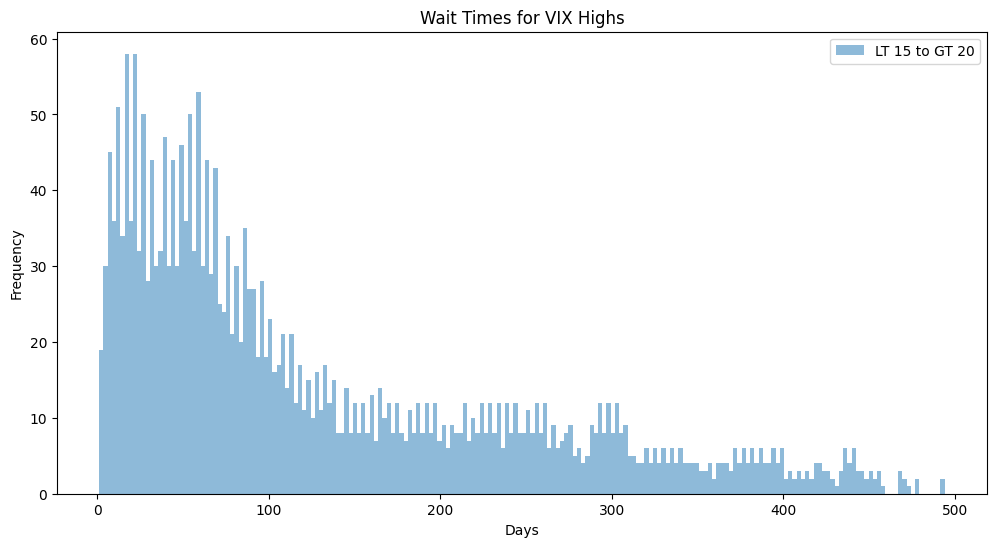

In [24]:
# Plot histogram for wait times
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.hist(res_lt15_to_gt20['wait_trading_days'].dropna(), bins=200, alpha=0.5, label='LT 15 to GT 20')
plt.xlabel('Days')
plt.ylabel('Frequency')
plt.title('Wait Times for VIX Highs')
plt.legend()
plt.show()

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import Optional, Tuple

def compute_wait_cdf(
    waits_df: pd.DataFrame,
    column: str = "wait_trading_days",
) -> pd.DataFrame:
    """
    Compute the empirical CDF for wait times.

    Returns a DataFrame with:
      - 'wait': unique wait values (sorted)
      - 'count': frequency for each wait
      - 'cdf': cumulative probability P(Wait <= x)
      - 'ccdf': complementary CDF = 1 - cdf (P(Wait > x))
    """
    # Drop NaNs; don't cast to int (keep original type)
    waits = waits_df[column].dropna().to_numpy()
    if waits.size == 0:
        return pd.DataFrame(columns=["wait", "count", "cdf", "ccdf"])

    # Unique values and counts
    vals, counts = np.unique(waits, return_counts=True)
    cum_counts = np.cumsum(counts)
    n = waits.size
    cdf = cum_counts / n
    ccdf = 1.0 - cdf

    out = pd.DataFrame(
        {"wait": vals, "count": counts, "cdf": cdf, "ccdf": ccdf}
    )
    return out

In [26]:
cdf_df = compute_wait_cdf(
    waits_df=res_lt15_to_gt20,
    column="wait_trading_days")

cdf_df


,wait,count,cdf,ccdf
0,1,1,0.00,1.00
1,2,7,0.00,1.00
2,3,11,0.01,0.99
3,4,15,0.01,0.99
4,5,15,0.02,0.98
...,...,...,...,...
461,472,1,1.00,0.00
462,478,1,1.00,0.00
463,479,1,1.00,0.00
464,493,1,1.00,0.00


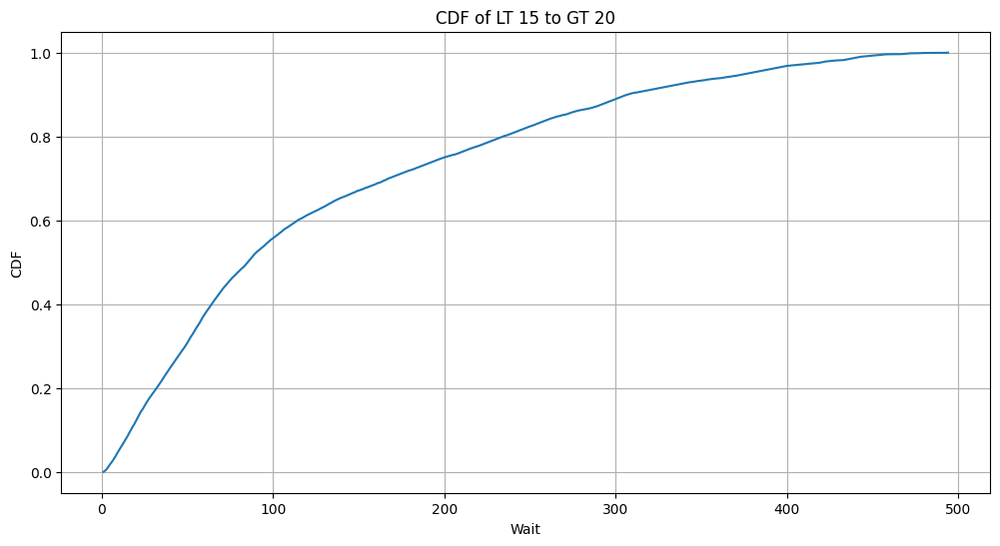

In [27]:
# Plot CDF
plt.figure(figsize=(12, 6))
plt.plot(cdf_df['wait'], cdf_df['cdf'])
plt.title('CDF of LT 15 to GT 20')
plt.xlabel('Wait')
plt.ylabel('CDF')
plt.grid()
plt.show()

In [28]:
import pandas as pd
import numpy as np

def empirical_hit_probabilities(
    df: pd.DataFrame,
    high_col: str,
    thresholds,
    horizons,
) -> pd.DataFrame:
    
    """
    Compute empirical probability of reaching a threshold high within given horizons.

    Parameters
    ----------
    df : pd.DataFrame
        Sorted daily data with a High column.
    high_col : str
        Name of the column with daily highs.
    thresholds : list of floats
        Target levels (e.g. [18,19,20,21,22]).
    horizons : list of ints
        Lookahead windows in trading days.

    Returns
    -------
    pd.DataFrame
        Rows = horizons, Cols = thresholds, entries = probability [0,1].
    """

    df = df.sort_index()
    highs = df[high_col].values
    n = len(highs)

    probs = pd.DataFrame(index=horizons, columns=thresholds, dtype=float)

    for h in horizons:
        valid_starts = n - h  # last h days have incomplete windows
        if valid_starts <= 0:
            continue
        window_max = np.array([highs[i+1:i+h+1].max() for i in range(valid_starts)])
        # note: exclude same day (i+1:...) so it's "future" only
        for thr in thresholds:
            hits = (window_max >= thr).sum()
            probs.loc[h, thr] = hits / valid_starts

    return probs


In [29]:
probs = empirical_hit_probabilities(
    df=vix, 
    high_col="High",
    thresholds=range(15, 35),
    horizons=range(5, 101, 5),
)

display(probs)

,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34
5,0.78,0.73,0.66,0.59,0.54,0.49,0.44,0.39,0.35,0.30,0.26,0.23,0.21,0.18,0.16,0.14,0.12,0.10,0.09,0.08
10,0.83,0.78,0.71,0.64,0.59,0.54,0.49,0.43,0.40,0.35,0.31,0.27,0.25,0.22,0.19,0.17,0.15,0.13,0.11,0.10
15,0.85,0.81,0.75,0.68,0.62,0.58,0.53,0.47,0.43,0.38,0.34,0.31,0.28,0.26,0.22,0.20,0.17,0.15,0.14,0.12
20,0.87,0.83,0.77,0.71,0.65,0.60,0.56,0.50,0.46,0.41,0.37,0.33,0.31,0.28,0.25,0.22,0.20,0.17,0.15,0.14
25,0.89,0.85,0.79,0.74,0.68,0.63,0.59,0.52,0.49,0.43,0.39,0.36,0.34,0.31,0.27,0.24,0.22,0.18,0.17,0.16
30,0.91,0.87,0.81,0.76,0.70,0.65,0.61,0.54,0.51,0.45,0.42,0.38,0.36,0.33,0.29,0.26,0.24,0.20,0.19,0.17
35,0.92,0.89,0.83,0.77,0.72,0.67,0.63,0.56,0.53,0.47,0.44,0.40,0.38,0.35,0.31,0.28,0.25,0.22,0.20,0.19
40,0.93,0.90,0.84,0.79,0.74,0.69,0.65,0.58,0.55,0.49,0.45,0.42,0.40,0.37,0.33,0.30,0.27,0.23,0.22,0.20
45,0.93,0.91,0.85,0.80,0.75,0.71,0.67,0.59,0.57,0.50,0.47,0.44,0.42,0.39,0.34,0.31,0.28,0.25,0.23,0.21
50,0.94,0.92,0.86,0.81,0.77,0.72,0.69,0.61,0.58,0.52,0.49,0.46,0.43,0.40,0.36,0.33,0.30,0.26,0.25,0.23


In [30]:
import pandas as pd
import numpy as np

def conditional_hit_probabilities(
    df: pd.DataFrame,
    today_high: float,
    high_col: str,
    thresholds,
    horizons,
    tolerance: float,  # how close history must be to today's high
) -> pd.DataFrame:
    
    """
    Conditional probability of hitting thresholds within horizons,
    given today's high is near `today_high`.

    Parameters
    ----------
    df : pd.DataFrame
        Daily data with highs.
    today_high : float
        Today's observed high.
    high_col : str
        Column containing the daily highs.
    thresholds : list of floats
        Target levels to evaluate (e.g., [18,19,20,...]).
    horizons : list of ints
        Lookahead windows (in trading days).
    tolerance : float
        Acceptable deviation from today's high when finding historical analogues.

    Returns
    -------
    pd.DataFrame
        Probabilities indexed by horizon (rows) and thresholds (columns).
    """
    
    df = df.sort_index()
    highs = df[high_col].values
    n = len(highs)

    # Find indices where the high ~ today's high
    candidates = np.where((highs >= today_high - tolerance) & (highs <= today_high + tolerance))[0]
    if len(candidates) == 0:
        raise ValueError("No historical days found within tolerance of today's high")

    probs = pd.DataFrame(index=horizons, columns=thresholds, dtype=float)

    for h in horizons:
        valid_hits = 0
        total = 0
        for i in candidates:
            if i + h < n:  # need full window
                window_max = highs[i+1:i+h+1].max()  # strictly future days
                for thr in thresholds:
                    if np.isnan(probs.loc[h, thr]):
                        probs.loc[h, thr] = 0.0
                    if window_max >= thr:
                        probs.loc[h, thr] += 1
                total += 1
        if total > 0:
            probs.loc[h] /= total  # normalize to probability
        else:
            probs.loc[h] = np.nan  # no valid examples

    return probs


In [31]:
# Get yesterday's high as an example
yesterday = vix.iloc[-2]
yesterday_high = vix['High'].iloc[-2]

display(yesterday)
display(yesterday_high)

cond_probs = conditional_hit_probabilities(
    df=vix,
    today_high=yesterday_high,
    high_col="High",
    thresholds=range(15, 31),
    horizons=range(5, 71, 5),
    tolerance=0.25
)

display(cond_probs)

Close   18.56
High    21.77
Low     18.39
Open    20.55
Name: 2025-11-25 00:00:00, dtype: float64

np.float64(21.77000045776367)

,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
5,1.00,1.00,1.00,1.00,0.98,0.96,0.87,0.61,0.42,0.26,0.16,0.08,0.03,0.02,0.02,0.02
10,1.00,1.00,1.00,1.00,0.99,0.97,0.91,0.73,0.61,0.42,0.28,0.19,0.14,0.10,0.09,0.08
15,1.00,1.00,1.00,1.00,0.99,0.98,0.95,0.77,0.65,0.49,0.39,0.30,0.25,0.20,0.17,0.16
20,1.00,1.00,1.00,1.00,0.99,0.98,0.95,0.80,0.69,0.54,0.44,0.36,0.30,0.25,0.22,0.20
25,1.00,1.00,1.00,1.00,0.99,0.98,0.95,0.83,0.71,0.56,0.49,0.40,0.33,0.30,0.25,0.22
30,1.00,1.00,1.00,1.00,0.99,0.98,0.96,0.86,0.74,0.58,0.52,0.45,0.39,0.32,0.26,0.23
35,1.00,1.00,1.00,1.00,0.99,0.98,0.96,0.89,0.76,0.62,0.55,0.48,0.42,0.36,0.30,0.25
40,1.00,1.00,1.00,1.00,0.99,0.98,0.96,0.91,0.80,0.66,0.56,0.51,0.45,0.38,0.32,0.27
45,1.00,1.00,1.00,1.00,0.99,0.98,0.96,0.91,0.83,0.68,0.60,0.52,0.46,0.40,0.34,0.30
50,1.00,1.00,1.00,1.00,0.99,0.98,0.97,0.92,0.83,0.69,0.62,0.55,0.51,0.44,0.38,0.32


## Plots - VIX

### Histogram Distribution - VIX

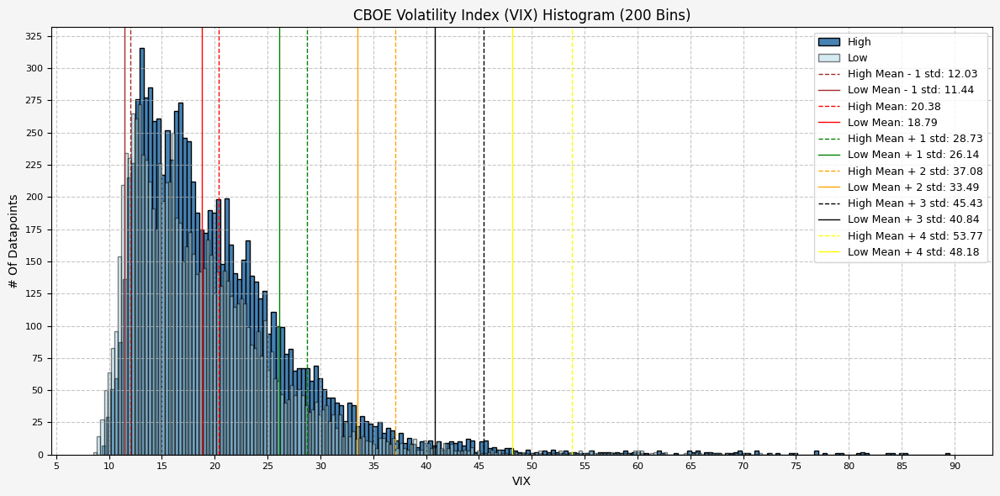

In [32]:
# Plotting
plt.figure(figsize=(12, 6), facecolor="#F5F5F5")

# Histogram
plt.hist([vix['High']], label=['High'], bins=200, edgecolor='black', color='steelblue', alpha=1)
plt.hist([vix['Low']], label=['Low'], bins=200, edgecolor='black', color='lightblue', alpha=0.5)

# Plot a vertical line at the mean, mean + 1 std, and mean + 2 std
plt.axvline(vix_stats.loc['mean + -1 std']['High'], color='brown', linestyle='dashed', linewidth=1, label=f'High Mean - 1 std: {vix_stats.loc['mean + -1 std']['High']:.2f}')
plt.axvline(vix_stats.loc['mean + -1 std']['Low'], color='brown', linestyle='solid', linewidth=1, label=f'Low Mean - 1 std: {vix_stats.loc['mean + -1 std']['Low']:.2f}')

plt.axvline(vix_stats.loc['mean']['High'], color='red', linestyle='dashed', linewidth=1, label=f'High Mean: {vix_stats.loc['mean']['High']:.2f}')
plt.axvline(vix_stats.loc['mean']['Low'], color='red', linestyle='solid', linewidth=1, label=f'Low Mean: {vix_stats.loc['mean']['Low']:.2f}')

plt.axvline(vix_stats.loc['mean + 1 std']['High'], color='green', linestyle='dashed', linewidth=1, label=f'High Mean + 1 std: {vix_stats.loc['mean + 1 std']['High']:.2f}')
plt.axvline(vix_stats.loc['mean + 1 std']['Low'], color='green', linestyle='solid', linewidth=1, label=f'Low Mean + 1 std: {vix_stats.loc['mean + 1 std']['Low']:.2f}')

plt.axvline(vix_stats.loc['mean + 2 std']['High'], color='orange', linestyle='dashed', linewidth=1, label=f'High Mean + 2 std: {vix_stats.loc['mean + 2 std']['High']:.2f}')
plt.axvline(vix_stats.loc['mean + 2 std']['Low'], color='orange', linestyle='solid', linewidth=1, label=f'Low Mean + 2 std: {vix_stats.loc['mean + 2 std']['Low']:.2f}')

plt.axvline(vix_stats.loc['mean + 3 std']['High'], color='black', linestyle='dashed', linewidth=1, label=f'High Mean + 3 std: {vix_stats.loc['mean + 3 std']['High']:.2f}')
plt.axvline(vix_stats.loc['mean + 3 std']['Low'], color='black', linestyle='solid', linewidth=1, label=f'Low Mean + 3 std: {vix_stats.loc['mean + 3 std']['Low']:.2f}')

plt.axvline(vix_stats.loc['mean + 4 std']['High'], color='yellow', linestyle='dashed', linewidth=1, label=f'High Mean + 4 std: {vix_stats.loc['mean + 4 std']['High']:.2f}')
plt.axvline(vix_stats.loc['mean + 4 std']['Low'], color='yellow', linestyle='solid', linewidth=1, label=f'Low Mean + 4 std: {vix_stats.loc['mean + 4 std']['Low']:.2f}')

# Set X axis
x_tick_spacing = 5  # Specify the interval for y-axis ticks
plt.gca().xaxis.set_major_locator(MultipleLocator(x_tick_spacing))
plt.xlabel("VIX", fontsize=10)
plt.xticks(rotation=0, fontsize=8)

# Set Y axis
y_tick_spacing = 25  # Specify the interval for y-axis ticks
plt.gca().yaxis.set_major_locator(MultipleLocator(y_tick_spacing))
plt.ylabel("# Of Datapoints", fontsize=10)
plt.yticks(fontsize=8)

# Set title, layout, grid, and legend
plt.title("CBOE Volatility Index (VIX) Histogram (200 Bins)", fontsize=12)
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=9)

# Save figure and display plot
plt.savefig("01_Histogram+Mean+SD.png", dpi=300, bbox_inches="tight")
plt.show()

### Historical Data - VIX

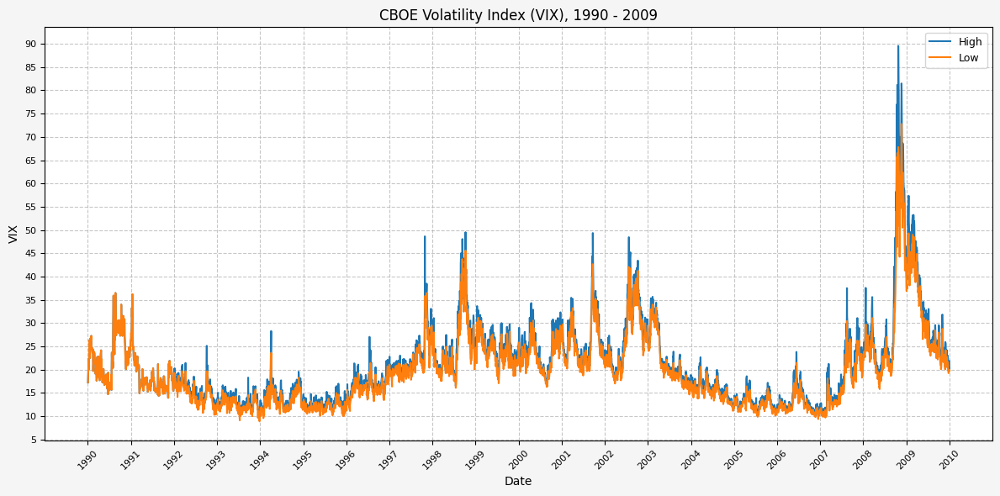

In [33]:
plot_timeseries(
    price_df=vix,
    plot_start_date=None,
    plot_end_date="2009-12-31",
    plot_columns=["High", "Low"],
    title="CBOE Volatility Index (VIX), 1990 - 2009",
    x_label="Date",
    x_format="Year",
    y_label="VIX",
    y_format="Decimal",
    y_format_decimal_places=0,
    y_tick_spacing=5,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="01_VIX_Plot_1990-2009",
)

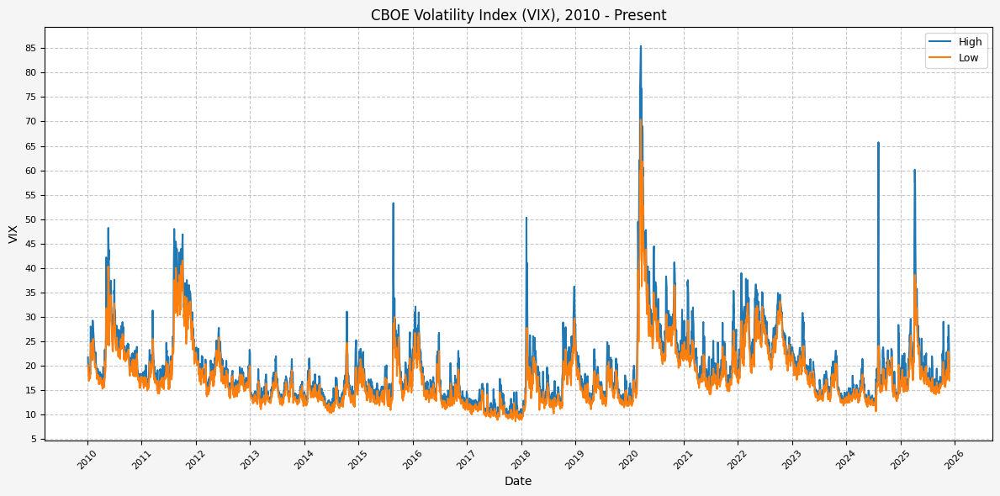

In [34]:
plot_timeseries(
    price_df=vix,
    plot_start_date="2010-01-01",
    plot_end_date=None,
    plot_columns=["High", "Low"],
    title="CBOE Volatility Index (VIX), 2010 - Present",
    x_label="Date",
    x_format="Year",
    y_label="VIX",
    y_format="Decimal",
    y_format_decimal_places=0,
    y_tick_spacing=5,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="01_VIX_Plot_2010-Present",
)

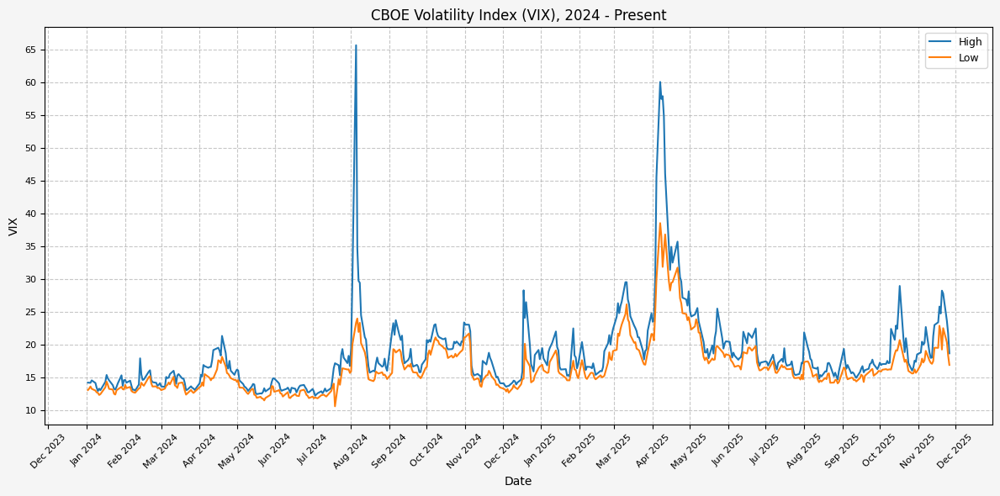

In [35]:
plot_timeseries(
    price_df=vix,
    plot_start_date="2024-01-01",
    plot_end_date=None,
    plot_columns=["High", "Low"],
    title="CBOE Volatility Index (VIX), 2024 - Present",
    x_label="Date",
    x_format="Month",
    y_label="VIX",
    y_format="Decimal",
    y_format_decimal_places=0,
    y_tick_spacing=5,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="01_VIX_Plot_2024-Present",
)

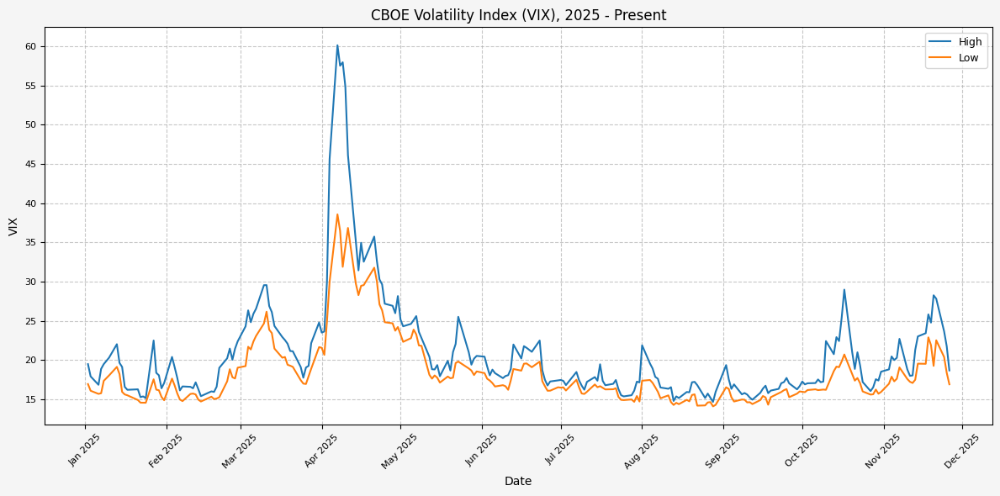

In [36]:
plot_timeseries(
    price_df=vix,
    plot_start_date="2025-01-01",
    plot_end_date=None,
    plot_columns=["High", "Low"],
    title="CBOE Volatility Index (VIX), 2025 - Present",
    x_label="Date",
    x_format="Month",
    y_label="VIX",
    y_format="Decimal",
    y_format_decimal_places=0,
    y_tick_spacing=5,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="01_VIX_Plot_2025-Present",
)

### Stats By Year - VIX

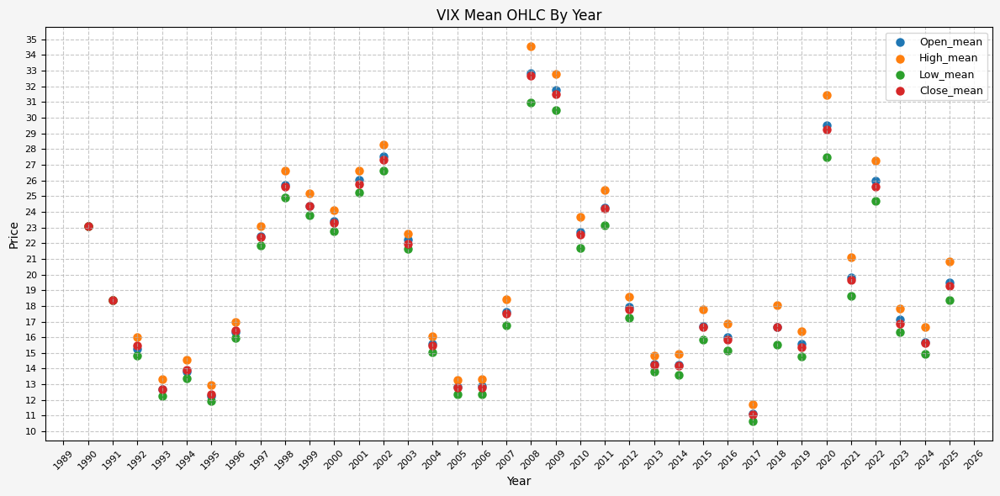

In [37]:
plot_stats(
    stats_df=vix_stats_by_year,
    plot_columns=["Open_mean", "High_mean", "Low_mean", "Close_mean"],
    title="VIX Mean OHLC By Year",
    x_label="Year",
    x_rotation=45,
    x_tick_spacing=1,
    y_label="Price",
    y_tick_spacing=1,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="01_VIX_Stats_By_Year"
)

### Stats By Month - VIX

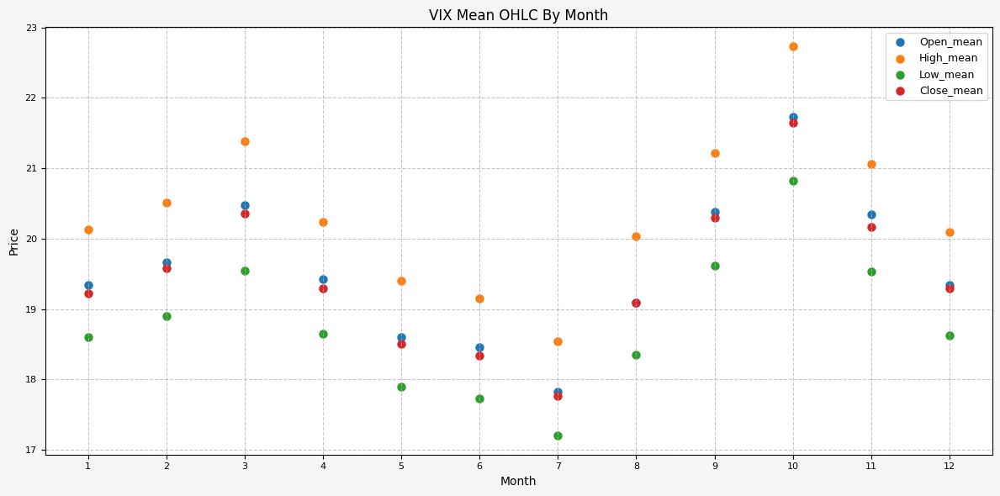

In [38]:
plot_stats(
    stats_df=vix_stats_by_month,
    plot_columns=["Open_mean", "High_mean", "Low_mean", "Close_mean"],
    title="VIX Mean OHLC By Month",
    x_label="Month",
    x_rotation=0,
    x_tick_spacing=1,
    y_label="Price",
    y_tick_spacing=1,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="01_VIX_Stats_By_Month"
)

## Data Overview - VVIX

### Acquire CBOE VVIX Data

In [39]:
yf_pull_data(
    base_directory=DATA_DIR,
    ticker="^VVIX",
    source="Yahoo_Finance", 
    asset_class="Indices", 
    excel_export=True,
    pickle_export=True,
    output_confirmation=True,
)

[*********************100%***********************]  1 of 1 completed

The first and last date of data for ^VVIX is: 


,Close,High,Low,Open,Volume
Date,,,,,
2007-01-03,87.63,87.63,87.63,87.63,0


,Close,High,Low,Open,Volume
Date,,,,,
2025-11-26,92.17,98.63,91.60,95.31,0


Yahoo Finance data complete for ^VVIX
--------------------


,Close,High,Low,Open,Volume
Date,,,,,
2007-01-03,87.63,87.63,87.63,87.63,0
2007-01-04,88.19,88.19,88.19,88.19,0
2007-01-05,90.17,90.17,90.17,90.17,0
2007-01-08,92.04,92.04,92.04,92.04,0
2007-01-09,92.76,92.76,92.76,92.76,0
...,...,...,...,...,...
2025-11-20,128.65,132.72,104.80,108.56,0
2025-11-21,118.34,132.60,117.06,125.44,0
2025-11-24,103.96,116.55,103.96,116.55,0


### Load Data - VVIX

In [40]:
# Set decimal places
pandas_set_decimal_places(2)

# VVIX
vvix = load_data(
    base_directory=DATA_DIR,
    ticker="^VVIX",
    source="Yahoo_Finance", 
    asset_class="Indices",
    timeframe="Daily",
    file_format="excel",
)

# Set 'Date' column as datetime
vvix['Date'] = pd.to_datetime(vvix['Date'])

# Drop 'Volume'
vvix.drop(columns = {'Volume'}, inplace = True)

# Set Date as index
vvix.set_index('Date', inplace = True)

# Check to see if there are any NaN values
vvix[vvix['High'].isna()]

# Forward fill to clean up missing data
vvix['High'] = vvix['High'].ffill()

### DataFrame Info - VVIX

In [41]:
df_info(vvix)

The columns, shape, and data types are:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4748 entries, 2007-01-03 to 2025-11-26
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   4748 non-null   float64
 1   High    4748 non-null   float64
 2   Low     4748 non-null   float64
 3   Open    4748 non-null   float64
dtypes: float64(4)
memory usage: 185.5 KB
None
The first 5 rows are:


,Close,High,Low,Open
Date,,,,
2007-01-03,87.63,87.63,87.63,87.63
2007-01-04,88.19,88.19,88.19,88.19
2007-01-05,90.17,90.17,90.17,90.17
2007-01-08,92.04,92.04,92.04,92.04
2007-01-09,92.76,92.76,92.76,92.76


The last 5 rows are:


,Close,High,Low,Open
Date,,,,
2025-11-20,128.65,132.72,104.80,108.56
2025-11-21,118.34,132.60,117.06,125.44
2025-11-24,103.96,116.55,103.96,116.55
2025-11-25,96.85,108.41,96.85,104.19
2025-11-26,92.17,98.63,91.60,95.31


In [42]:
# Copy this <!-- INSERT_02_VVIX_DF_Info_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="02_VVIX_DF_Info.md", content=df_info_markdown(vix))

✅ Exported and tracked: 02_VVIX_DF_Info.md


### Statistics - VVIX

In [43]:
vvix_stats = vvix.describe()
num_std = [-1, 0, 1, 2, 3, 4, 5]
for num in num_std:
    vvix_stats.loc[f"mean + {num} std"] = {
        'Open': vvix_stats.loc['mean']['Open'] + num * vvix_stats.loc['std']['Open'],
        'High': vvix_stats.loc['mean']['High'] + num * vvix_stats.loc['std']['High'],
        'Low': vvix_stats.loc['mean']['Low'] + num * vvix_stats.loc['std']['Low'],
        'Close': vvix_stats.loc['mean']['Close'] + num * vvix_stats.loc['std']['Close'],
    }
display(vvix_stats)

,Close,High,Low,Open
count,4748.00,4748.00,4748.00,4748.00
mean,93.65,95.75,92.07,93.90
std,16.31,17.95,14.96,16.37
min,59.74,59.74,59.31,59.31
25%,82.53,83.73,81.64,82.75
50%,90.86,92.58,89.66,91.22
75%,102.26,105.14,99.95,102.62
max,207.59,212.22,187.27,212.22
mean + -1 std,77.34,77.80,77.11,77.54
mean + 0 std,93.65,95.75,92.07,93.90


In [44]:
# Copy this <!-- INSERT_02_VVIX_Stats_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="02_VVIX_Stats.md", content=vvix_stats.to_markdown(floatfmt=".2f"))

✅ Exported and tracked: 02_VVIX_Stats.md


In [45]:
# Group by year and calculate mean and std for OHLC
vvix_stats_by_year = vvix.groupby(vvix.index.year)[["Open", "High", "Low", "Close"]].agg(["mean", "std", "min", "max"])

# Flatten the column MultiIndex
vvix_stats_by_year.columns = ['_'.join(col).strip() for col in vvix_stats_by_year.columns.values]
vvix_stats_by_year.index.name = "Year"

display(vvix_stats_by_year)

,Open_mean,Open_std,Open_min,Open_max,High_mean,High_std,High_min,High_max,Low_mean,Low_std,Low_min,Low_max,Close_mean,Close_std,Close_min,Close_max
Year,,,,,,,,,,,,,,,,
2007,87.68,13.31,63.52,142.99,87.68,13.31,63.52,142.99,87.68,13.31,63.52,142.99,87.68,13.31,63.52,142.99
2008,81.85,15.60,59.74,134.87,81.85,15.60,59.74,134.87,81.85,15.60,59.74,134.87,81.85,15.60,59.74,134.87
2009,79.78,8.63,64.95,104.02,79.78,8.63,64.95,104.02,79.78,8.63,64.95,104.02,79.78,8.63,64.95,104.02
2010,88.36,13.07,64.87,145.12,88.36,13.07,64.87,145.12,88.36,13.07,64.87,145.12,88.36,13.07,64.87,145.12
2011,92.94,10.21,75.94,134.63,92.94,10.21,75.94,134.63,92.94,10.21,75.94,134.63,92.94,10.21,75.94,134.63
2012,94.84,8.38,78.42,117.44,94.84,8.38,78.42,117.44,94.84,8.38,78.42,117.44,94.84,8.38,78.42,117.44
2013,80.52,8.97,62.71,111.43,80.52,8.97,62.71,111.43,80.52,8.97,62.71,111.43,80.52,8.97,62.71,111.43
2014,83.01,14.33,61.76,138.60,83.01,14.33,61.76,138.60,83.01,14.33,61.76,138.60,83.01,14.33,61.76,138.60
2015,95.44,15.59,73.07,212.22,98.47,16.39,76.41,212.22,92.15,13.35,72.20,148.68,94.82,14.75,73.18,168.75


In [46]:
# Copy this <!-- INSERT_02_VVIX_Stats_By_Year_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="02_VVIX_Stats_By_Year.md", content=vvix_stats_by_year.to_markdown(floatfmt=".2f"))

✅ Exported and tracked: 02_VVIX_Stats_By_Year.md


In [47]:
# Group by month and calculate mean and std for OHLC
vvix_stats_by_month = vvix.groupby(vvix.index.month)[["Open", "High", "Low", "Close"]].agg(["mean", "std", "min", "max"])

# Flatten the column MultiIndex
vvix_stats_by_month.columns = ['_'.join(col).strip() for col in vvix_stats_by_month.columns.values]
vvix_stats_by_month.index.name = "Year"

display(vvix_stats_by_month)

,Open_mean,Open_std,Open_min,Open_max,High_mean,High_std,High_min,High_max,Low_mean,Low_std,Low_min,Low_max,Close_mean,Close_std,Close_min,Close_max
Year,,,,,,,,,,,,,,,,
1,92.46,15.63,64.87,161.09,94.37,17.63,64.87,172.82,90.69,14.23,64.87,153.26,92.23,15.78,64.87,157.69
2,93.49,18.24,65.47,176.72,95.39,20.70,65.47,203.73,91.39,16.43,65.47,165.35,93.13,18.58,65.47,180.61
3,95.30,21.66,66.97,203.03,97.38,23.56,66.97,209.76,92.94,19.51,66.97,187.27,94.89,21.59,66.97,207.59
4,92.18,19.03,59.74,186.33,94.01,20.57,59.74,189.03,90.30,17.21,59.74,152.01,91.88,18.60,59.74,170.92
5,92.25,16.93,61.76,145.18,93.95,17.99,61.76,151.50,90.54,16.14,61.76,145.12,91.79,16.79,61.76,146.28
6,93.16,14.86,63.52,155.48,94.76,16.11,63.52,172.21,91.49,13.79,63.52,140.15,92.98,14.83,63.52,151.60
7,90.10,12.82,67.21,138.42,91.63,13.88,67.21,149.60,88.60,11.94,67.21,133.82,89.98,12.78,67.21,139.54
8,96.84,16.53,68.05,212.22,98.99,18.33,68.05,212.22,94.67,14.50,68.05,148.68,96.61,16.24,68.05,173.32
9,94.91,13.70,67.94,135.17,96.84,15.36,67.94,147.14,93.04,12.20,67.94,128.46,94.58,13.44,67.94,138.93


In [48]:
# Copy this <!-- INSERT_02_VVIX_Stats_By_Month_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="02_VVIX_Stats_By_Month.md", content=vvix_stats_by_month.to_markdown(floatfmt=".2f"))

✅ Exported and tracked: 02_VVIX_Stats_By_Month.md


### Deciles - VVIX

In [49]:
vvix_deciles = vvix.quantile(np.arange(0, 1.1, 0.1))
display(vvix_deciles)

,Close,High,Low,Open
0.00,59.74,59.74,59.31,59.31
0.10,76.02,76.26,75.56,76.03
0.20,80.77,81.60,79.99,80.93
0.30,84.13,85.47,83.21,84.44
0.40,87.47,88.92,86.29,87.76
0.50,90.86,92.58,89.66,91.22
0.60,94.49,96.64,93.27,94.79
0.70,99.20,101.71,97.50,99.51
0.80,105.97,109.41,103.76,106.46
0.90,115.20,118.74,112.37,115.32


In [50]:
# Copy this <!-- INSERT_02_VVIX_Deciles_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="02_VVIX_Deciles.md", content=vvix_deciles.to_markdown(floatfmt=".2f"))

✅ Exported and tracked: 02_VVIX_Deciles.md


## Plots - VVIX

### Histogram Distribution - VVIX

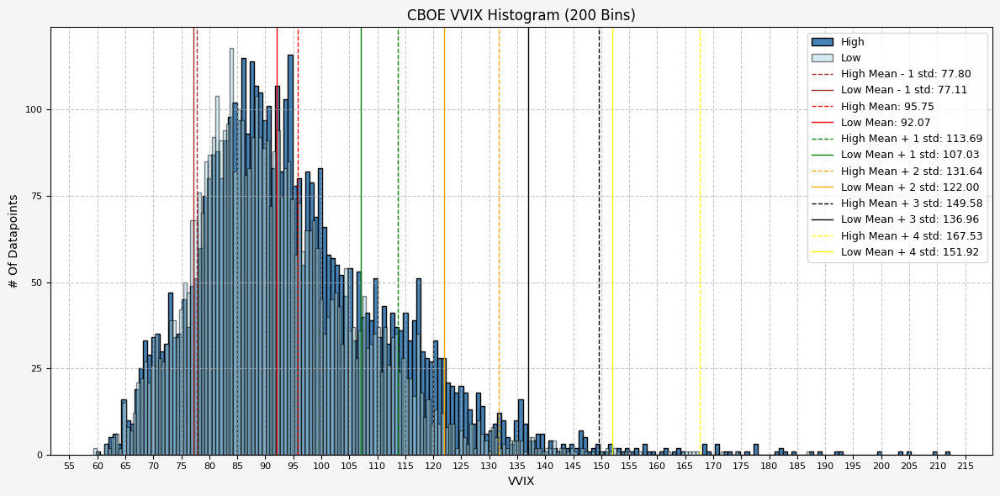

In [51]:
# Plotting
plt.figure(figsize=(12, 6), facecolor="#F5F5F5")

# Histogram
plt.hist([vvix['High']], label=['High'], bins=200, edgecolor='black', color='steelblue', alpha=1)
plt.hist([vvix['Low']], label=['Low'], bins=200, edgecolor='black', color='lightblue', alpha=0.5)

# Plot a vertical line at the mean, mean + 1 std, and mean + 2 std
plt.axvline(vvix_stats.loc['mean + -1 std']['High'], color='brown', linestyle='dashed', linewidth=1, label=f'High Mean - 1 std: {vvix_stats.loc['mean + -1 std']['High']:.2f}')
plt.axvline(vvix_stats.loc['mean + -1 std']['Low'], color='brown', linestyle='solid', linewidth=1, label=f'Low Mean - 1 std: {vvix_stats.loc['mean + -1 std']['Low']:.2f}')

plt.axvline(vvix_stats.loc['mean']['High'], color='red', linestyle='dashed', linewidth=1, label=f'High Mean: {vvix_stats.loc['mean']['High']:.2f}')
plt.axvline(vvix_stats.loc['mean']['Low'], color='red', linestyle='solid', linewidth=1, label=f'Low Mean: {vvix_stats.loc['mean']['Low']:.2f}')

plt.axvline(vvix_stats.loc['mean + 1 std']['High'], color='green', linestyle='dashed', linewidth=1, label=f'High Mean + 1 std: {vvix_stats.loc['mean + 1 std']['High']:.2f}')
plt.axvline(vvix_stats.loc['mean + 1 std']['Low'], color='green', linestyle='solid', linewidth=1, label=f'Low Mean + 1 std: {vvix_stats.loc['mean + 1 std']['Low']:.2f}')

plt.axvline(vvix_stats.loc['mean + 2 std']['High'], color='orange', linestyle='dashed', linewidth=1, label=f'High Mean + 2 std: {vvix_stats.loc['mean + 2 std']['High']:.2f}')
plt.axvline(vvix_stats.loc['mean + 2 std']['Low'], color='orange', linestyle='solid', linewidth=1, label=f'Low Mean + 2 std: {vvix_stats.loc['mean + 2 std']['Low']:.2f}')

plt.axvline(vvix_stats.loc['mean + 3 std']['High'], color='black', linestyle='dashed', linewidth=1, label=f'High Mean + 3 std: {vvix_stats.loc['mean + 3 std']['High']:.2f}')
plt.axvline(vvix_stats.loc['mean + 3 std']['Low'], color='black', linestyle='solid', linewidth=1, label=f'Low Mean + 3 std: {vvix_stats.loc['mean + 3 std']['Low']:.2f}')

plt.axvline(vvix_stats.loc['mean + 4 std']['High'], color='yellow', linestyle='dashed', linewidth=1, label=f'High Mean + 4 std: {vvix_stats.loc['mean + 4 std']['High']:.2f}')
plt.axvline(vvix_stats.loc['mean + 4 std']['Low'], color='yellow', linestyle='solid', linewidth=1, label=f'Low Mean + 4 std: {vvix_stats.loc['mean + 4 std']['Low']:.2f}')

# Set X axis
x_tick_spacing = 5  # Specify the interval for y-axis ticks
plt.gca().xaxis.set_major_locator(MultipleLocator(x_tick_spacing))
plt.xlabel("VVIX", fontsize=10)
plt.xticks(rotation=0, fontsize=8)

# Set Y axis
y_tick_spacing = 25  # Specify the interval for y-axis ticks
plt.gca().yaxis.set_major_locator(MultipleLocator(y_tick_spacing))
plt.ylabel("# Of Datapoints", fontsize=10)
plt.yticks(fontsize=8)

# Set title, layout, grid, and legend
plt.title("CBOE VVIX Histogram (200 Bins)", fontsize=12)
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=9)

# Save figure and display plot
plt.savefig("02_Histogram+Mean+SD.png", dpi=300, bbox_inches="tight")
plt.show()

### Historical Data - VVIX

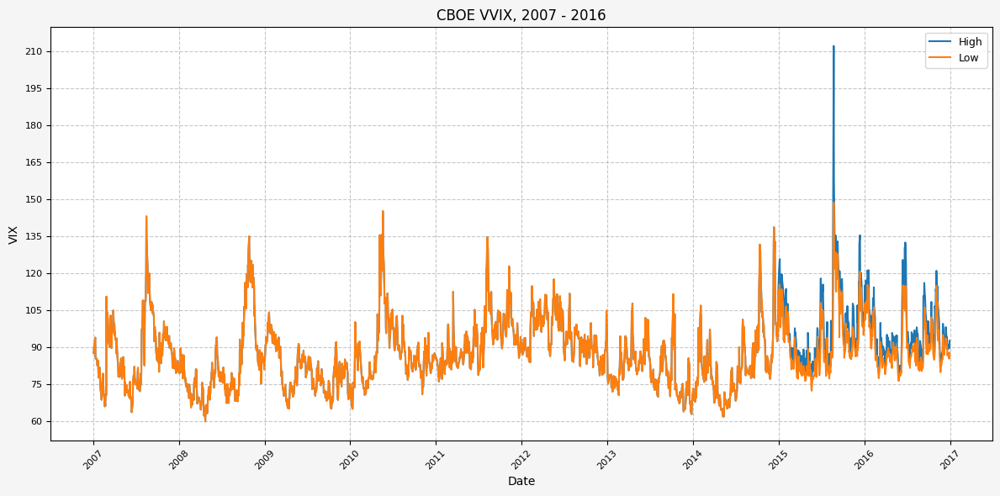

In [52]:
plot_timeseries(
    price_df=vvix,
    plot_start_date=None,
    plot_end_date="2016-12-31",
    plot_columns=["High", "Low"],
    title="CBOE VVIX, 2007 - 2016",
    x_label="Date",
    x_format="Year",
    y_label="VIX",
    y_format="Decimal",
    y_format_decimal_places=0,
    y_tick_spacing=15,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="02_VVIX_Plot_2007-2016",
)

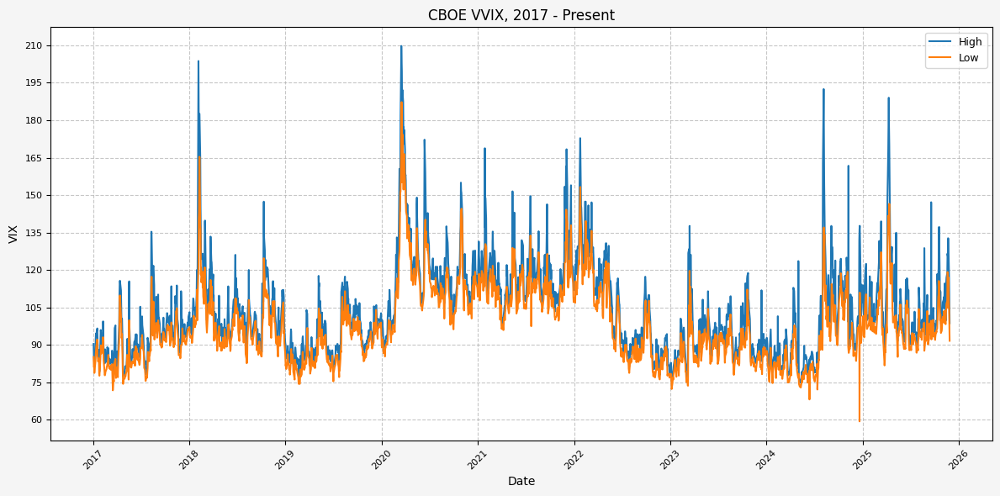

In [53]:
plot_timeseries(
    price_df=vvix,
    plot_start_date="2017-01-01",
    plot_end_date=None,
    plot_columns=["High", "Low"],
    title="CBOE VVIX, 2017 - Present",
    x_label="Date",
    x_format="Year",
    y_label="VIX",
    y_format="Decimal",
    y_format_decimal_places=0,
    y_tick_spacing=15,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="02_VVIX_Plot_2017-Present",
)

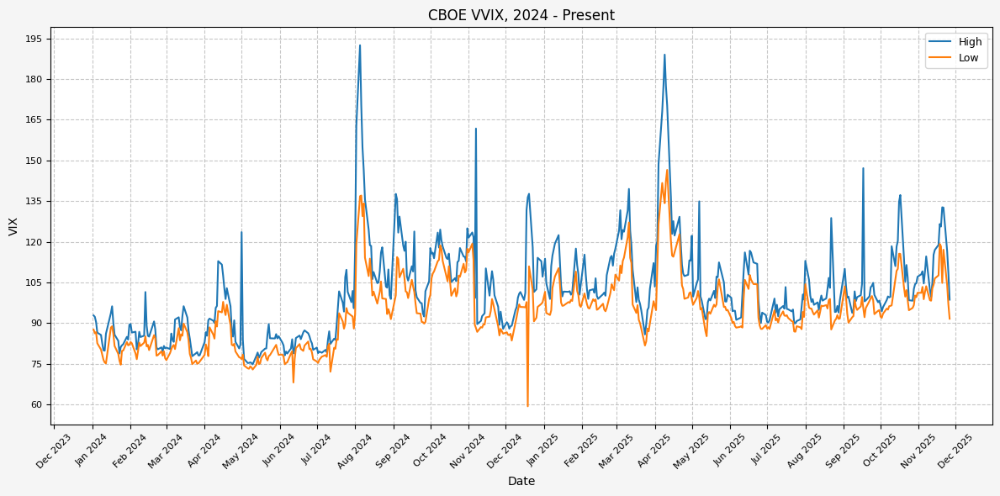

In [54]:
plot_timeseries(
    price_df=vvix,
    plot_start_date="2024-01-01",
    plot_end_date=None,
    plot_columns=["High", "Low"],
    title="CBOE VVIX, 2024 - Present",
    x_label="Date",
    x_format="Month",
    y_label="VIX",
    y_format="Decimal",
    y_format_decimal_places=0,
    y_tick_spacing=15,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="02_VVIX_Plot_2024-Present",
)

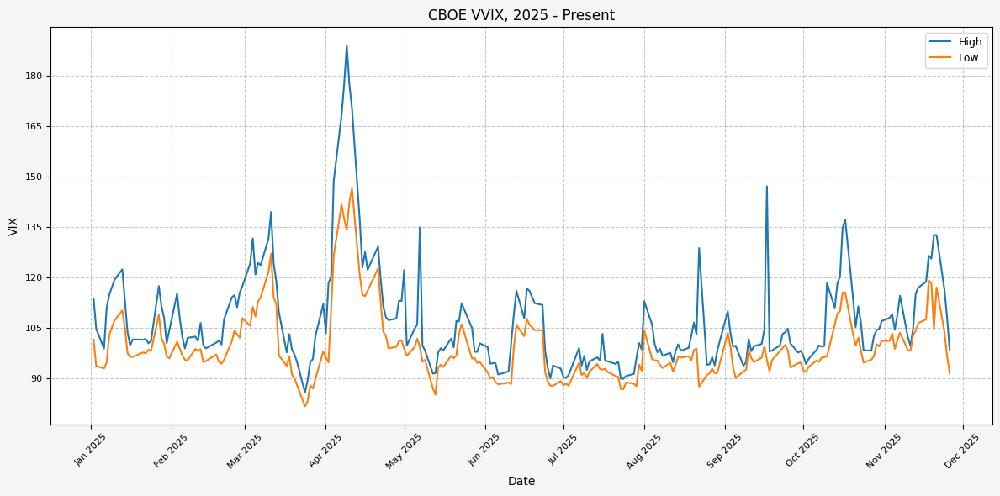

In [55]:
plot_timeseries(
    price_df=vvix,
    plot_start_date="2025-01-01",
    plot_end_date=None,
    plot_columns=["High", "Low"],
    title="CBOE VVIX, 2025 - Present",
    x_label="Date",
    x_format="Month",
    y_label="VIX",
    y_format="Decimal",
    y_format_decimal_places=0,
    y_tick_spacing=15,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="02_VVIX_Plot_2025-Present",
)

### Stats By Year - VVIX

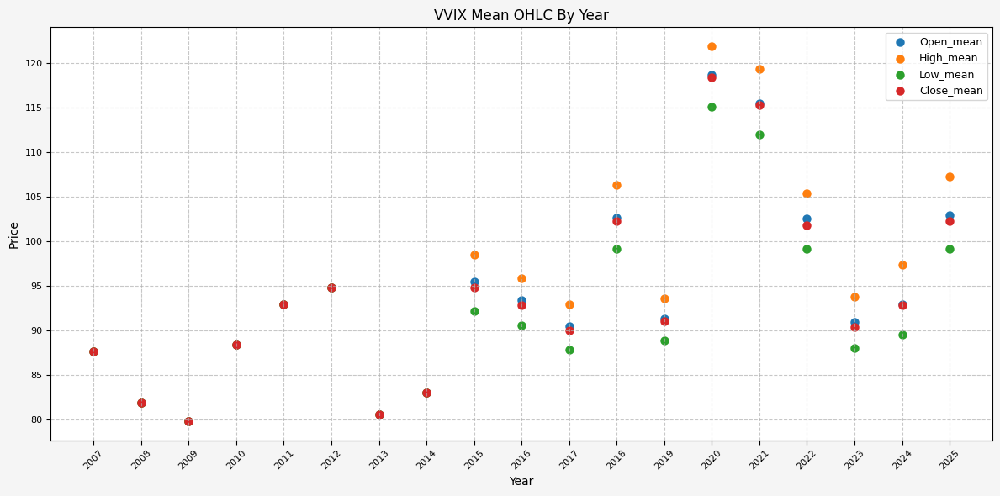

In [56]:
plot_stats(
    stats_df=vvix_stats_by_year,
    plot_columns=["Open_mean", "High_mean", "Low_mean", "Close_mean"],
    title="VVIX Mean OHLC By Year",
    x_label="Year",
    x_rotation=45,
    x_tick_spacing=1,
    y_label="Price",
    y_tick_spacing=5,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="02_VVIX_Stats_By_Year"
)

### Stats By Month - VVIX

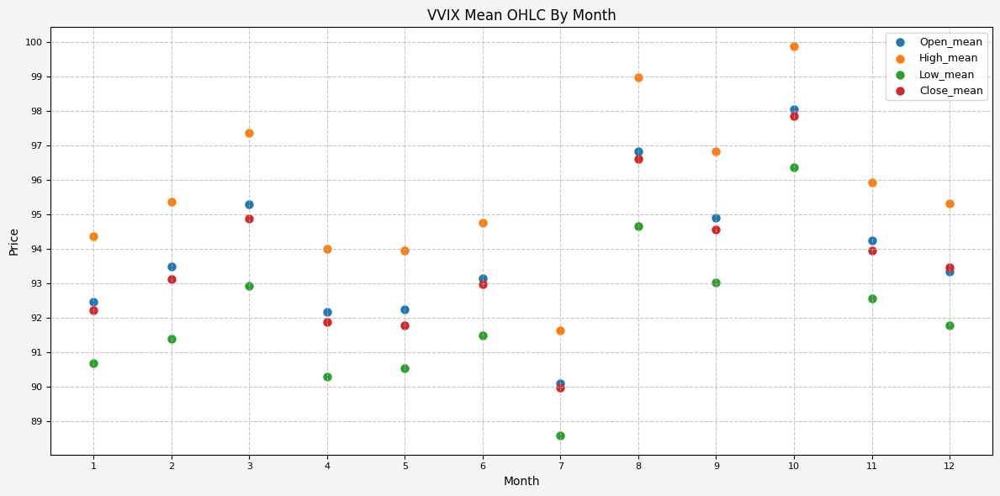

In [57]:
plot_stats(
    stats_df=vvix_stats_by_month,
    plot_columns=["Open_mean", "High_mean", "Low_mean", "Close_mean"],
    title="VVIX Mean OHLC By Month",
    x_label="Month",
    x_rotation=0,
    x_tick_spacing=1,
    y_label="Price",
    y_tick_spacing=1,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="02_VVIX_Stats_By_Month"
)

## Data Overview - VIX/VVIX

### Merge VIX & VVIX Data

In [58]:
# Merge VIX and VVIX dataframes on Date
vix_over_vvix = pd.merge(vix, vvix, left_index=True, right_index=True, suffixes=('_VIX', '_VVIX'))

# Calc VIX/VVIX ratios
vix_over_vvix['Close_VIX_to_VVIX_Ratio'] = vix_over_vvix['Close_VIX'] / vix_over_vvix['Close_VVIX']
vix_over_vvix['High_VIX_to_VVIX_Ratio'] = vix_over_vvix['High_VIX'] / vix_over_vvix['High_VVIX']
vix_over_vvix['Low_VIX_to_VVIX_Ratio'] = vix_over_vvix['Low_VIX'] / vix_over_vvix['Low_VVIX']
vix_over_vvix['Open_VIX_to_VVIX_Ratio'] = vix_over_vvix['Open_VIX'] / vix_over_vvix['Open_VVIX']

# Drop VIX and VVIX columns, keep only ratio columns
vix_over_vvix = vix_over_vvix[['Close_VIX_to_VVIX_Ratio', 'High_VIX_to_VVIX_Ratio', 'Low_VIX_to_VVIX_Ratio', 'Open_VIX_to_VVIX_Ratio']]

In [59]:
df_info(vix_over_vvix)

The columns, shape, and data types are:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4748 entries, 2007-01-03 to 2025-11-26
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Close_VIX_to_VVIX_Ratio  4748 non-null   float64
 1   High_VIX_to_VVIX_Ratio   4748 non-null   float64
 2   Low_VIX_to_VVIX_Ratio    4748 non-null   float64
 3   Open_VIX_to_VVIX_Ratio   4748 non-null   float64
dtypes: float64(4)
memory usage: 185.5 KB
None
The first 5 rows are:


,Close_VIX_to_VVIX_Ratio,High_VIX_to_VVIX_Ratio,Low_VIX_to_VVIX_Ratio,Open_VIX_to_VVIX_Ratio
Date,,,,
2007-01-03,0.14,0.15,0.13,0.14
2007-01-04,0.13,0.14,0.13,0.14
2007-01-05,0.13,0.14,0.13,0.13
2007-01-08,0.13,0.14,0.13,0.14
2007-01-09,0.13,0.13,0.13,0.13


The last 5 rows are:


,Close_VIX_to_VVIX_Ratio,High_VIX_to_VVIX_Ratio,Low_VIX_to_VVIX_Ratio,Open_VIX_to_VVIX_Ratio
Date,,,,
2025-11-20,0.21,0.21,0.18,0.19
2025-11-21,0.20,0.21,0.19,0.21
2025-11-24,0.20,0.20,0.20,0.19
2025-11-25,0.19,0.20,0.19,0.20
2025-11-26,0.19,0.19,0.18,0.19


In [60]:
# Copy this <!-- INSERT_03_VIX_Over_VVIX_DF_Info_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="03_VIX_Over_VVIX_DF_Info.md", content=df_info_markdown(vix_over_vvix))

✅ Exported and tracked: 03_VIX_Over_VVIX_DF_Info.md


### Statistics - VIX/VVIX

In [61]:
vix_over_vvix_stats = vix_over_vvix.describe()
num_std = [-1, 0, 1, 2, 3, 4, 5]
for num in num_std:
    vix_over_vvix_stats.loc[f"mean + {num} std"] = {
        'Open_VIX_to_VVIX_Ratio': vix_over_vvix_stats.loc['mean']['Open_VIX_to_VVIX_Ratio'] + num * vix_over_vvix_stats.loc['std']['Open_VIX_to_VVIX_Ratio'],
        'High_VIX_to_VVIX_Ratio': vix_over_vvix_stats.loc['mean']['High_VIX_to_VVIX_Ratio'] + num * vix_over_vvix_stats.loc['std']['High_VIX_to_VVIX_Ratio'],
        'Low_VIX_to_VVIX_Ratio': vix_over_vvix_stats.loc['mean']['Low_VIX_to_VVIX_Ratio'] + num * vix_over_vvix_stats.loc['std']['Low_VIX_to_VVIX_Ratio'],
        'Close_VIX_to_VVIX_Ratio': vix_over_vvix_stats.loc['mean']['Close_VIX_to_VVIX_Ratio'] + num * vix_over_vvix_stats.loc['std']['Close_VIX_to_VVIX_Ratio'],
    }
    
display(vix_over_vvix_stats)

,Close_VIX_to_VVIX_Ratio,High_VIX_to_VVIX_Ratio,Low_VIX_to_VVIX_Ratio,Open_VIX_to_VVIX_Ratio
count,4748.00,4748.00,4748.00,4748.00
mean,0.21,0.22,0.21,0.21
std,0.09,0.09,0.08,0.09
min,0.10,0.10,0.10,0.10
25%,0.16,0.16,0.16,0.16
50%,0.19,0.19,0.18,0.19
75%,0.24,0.25,0.23,0.24
max,0.76,0.81,0.72,0.81
mean + -1 std,0.13,0.13,0.12,0.13
mean + 0 std,0.21,0.22,0.21,0.21


In [62]:
# Copy this <!-- INSERT_03_VIX_Over_VVIX_Stats_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="03_VIX_Over_VVIX_Stats.md", content=vix_over_vvix_stats.to_markdown(floatfmt=".2f"))

✅ Exported and tracked: 03_VIX_Over_VVIX_Stats.md


In [63]:
# # Group by year and calculate mean and std for OHLC
# vvix_stats_by_year = vvix.groupby(vvix.index.year)[["Open", "High", "Low", "Close"]].agg(["mean", "std", "min", "max"])

# # Flatten the column MultiIndex
# vvix_stats_by_year.columns = ['_'.join(col).strip() for col in vvix_stats_by_year.columns.values]
# vvix_stats_by_year.index.name = "Year"

# display(vvix_stats_by_year)

In [64]:
# # Copy this <!-- INSERT_02_VVIX_Stats_By_Year_HERE --> to index_temp.md
# export_track_md_deps(dep_file=dep_file, md_filename="02_VVIX_Stats_By_Year.md", content=vvix_stats_by_year.to_markdown(floatfmt=".2f"))

In [65]:
# # Group by month and calculate mean and std for OHLC
# vvix_stats_by_month = vvix.groupby(vvix.index.month)[["Open", "High", "Low", "Close"]].agg(["mean", "std", "min", "max"])

# # Flatten the column MultiIndex
# vvix_stats_by_month.columns = ['_'.join(col).strip() for col in vvix_stats_by_month.columns.values]
# vvix_stats_by_month.index.name = "Year"

# display(vvix_stats_by_month)

In [66]:
# # Copy this <!-- INSERT_02_VVIX_Stats_By_Month_HERE --> to index_temp.md
# export_track_md_deps(dep_file=dep_file, md_filename="02_VVIX_Stats_By_Month.md", content=vvix_stats_by_month.to_markdown(floatfmt=".2f"))

### Deciles - VIX/VVIX

In [67]:
vix_over_vvix_deciles = vix_over_vvix.quantile(np.arange(0, 1.1, 0.1))
display(vix_over_vvix_deciles)

,Close_VIX_to_VVIX_Ratio,High_VIX_to_VVIX_Ratio,Low_VIX_to_VVIX_Ratio,Open_VIX_to_VVIX_Ratio
0.00,0.10,0.10,0.10,0.10
0.10,0.14,0.15,0.14,0.14
0.20,0.16,0.16,0.15,0.16
0.30,0.16,0.17,0.16,0.17
0.40,0.17,0.18,0.17,0.17
0.50,0.19,0.19,0.18,0.19
0.60,0.20,0.21,0.19,0.20
0.70,0.22,0.23,0.22,0.22
0.80,0.26,0.27,0.25,0.26
0.90,0.32,0.33,0.31,0.32


In [68]:
# Copy this <!-- INSERT_03_VIX_Over_VVIX_Deciles_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="03_VIX_Over_VVIX_Deciles.md", content=vix_over_vvix_deciles.to_markdown(floatfmt=".2f"))

✅ Exported and tracked: 03_VIX_Over_VVIX_Deciles.md


## Plots - VIX/VVIX

### Histogram Distribution - VIX/VVIX

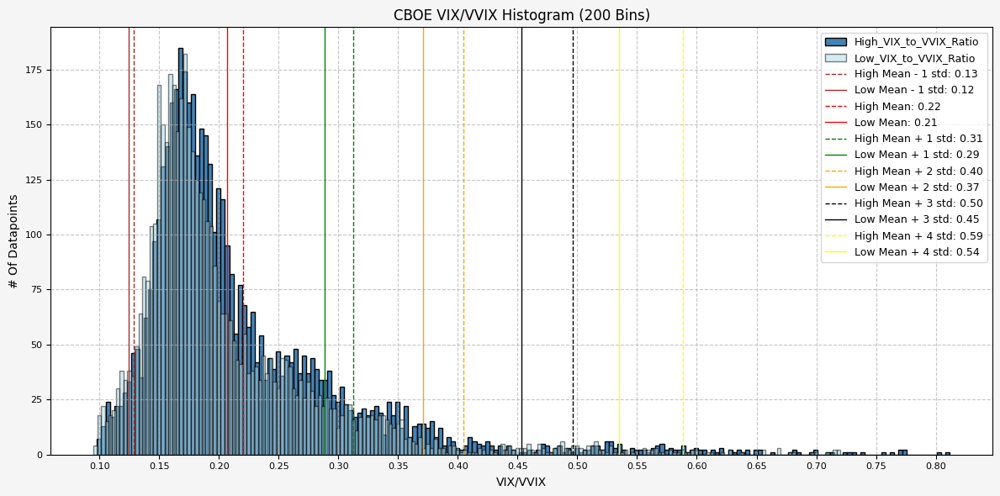

In [69]:
# Plotting
plt.figure(figsize=(12, 6), facecolor="#F5F5F5")

# Histogram
plt.hist([vix_over_vvix['High_VIX_to_VVIX_Ratio']], label=['High_VIX_to_VVIX_Ratio'], bins=200, edgecolor='black', color='steelblue', alpha=1)
plt.hist([vix_over_vvix['Low_VIX_to_VVIX_Ratio']], label=['Low_VIX_to_VVIX_Ratio'], bins=200, edgecolor='black', color='lightblue', alpha=0.5)

# Plot a vertical line at the mean, mean + 1 std, and mean + 2 std
plt.axvline(vix_over_vvix_stats.loc['mean + -1 std']['High_VIX_to_VVIX_Ratio'], color='brown', linestyle='dashed', linewidth=1, label=f'High Mean - 1 std: {vix_over_vvix_stats.loc['mean + -1 std']['High_VIX_to_VVIX_Ratio']:.2f}')
plt.axvline(vix_over_vvix_stats.loc['mean + -1 std']['Low_VIX_to_VVIX_Ratio'], color='brown', linestyle='solid', linewidth=1, label=f'Low Mean - 1 std: {vix_over_vvix_stats.loc['mean + -1 std']['Low_VIX_to_VVIX_Ratio']:.2f}')

plt.axvline(vix_over_vvix_stats.loc['mean']['High_VIX_to_VVIX_Ratio'], color='red', linestyle='dashed', linewidth=1, label=f'High Mean: {vix_over_vvix_stats.loc['mean']['High_VIX_to_VVIX_Ratio']:.2f}')
plt.axvline(vix_over_vvix_stats.loc['mean']['Low_VIX_to_VVIX_Ratio'], color='red', linestyle='solid', linewidth=1, label=f'Low Mean: {vix_over_vvix_stats.loc['mean']['Low_VIX_to_VVIX_Ratio']:.2f}')

plt.axvline(vix_over_vvix_stats.loc['mean + 1 std']['High_VIX_to_VVIX_Ratio'], color='green', linestyle='dashed', linewidth=1, label=f'High Mean + 1 std: {vix_over_vvix_stats.loc['mean + 1 std']['High_VIX_to_VVIX_Ratio']:.2f}')
plt.axvline(vix_over_vvix_stats.loc['mean + 1 std']['Low_VIX_to_VVIX_Ratio'], color='green', linestyle='solid', linewidth=1, label=f'Low Mean + 1 std: {vix_over_vvix_stats.loc['mean + 1 std']['Low_VIX_to_VVIX_Ratio']:.2f}')

plt.axvline(vix_over_vvix_stats.loc['mean + 2 std']['High_VIX_to_VVIX_Ratio'], color='orange', linestyle='dashed', linewidth=1, label=f'High Mean + 2 std: {vix_over_vvix_stats.loc['mean + 2 std']['High_VIX_to_VVIX_Ratio']:.2f}')
plt.axvline(vix_over_vvix_stats.loc['mean + 2 std']['Low_VIX_to_VVIX_Ratio'], color='orange', linestyle='solid', linewidth=1, label=f'Low Mean + 2 std: {vix_over_vvix_stats.loc['mean + 2 std']['Low_VIX_to_VVIX_Ratio']:.2f}')

plt.axvline(vix_over_vvix_stats.loc['mean + 3 std']['High_VIX_to_VVIX_Ratio'], color='black', linestyle='dashed', linewidth=1, label=f'High Mean + 3 std: {vix_over_vvix_stats.loc['mean + 3 std']['High_VIX_to_VVIX_Ratio']:.2f}')
plt.axvline(vix_over_vvix_stats.loc['mean + 3 std']['Low_VIX_to_VVIX_Ratio'], color='black', linestyle='solid', linewidth=1, label=f'Low Mean + 3 std: {vix_over_vvix_stats.loc['mean + 3 std']['Low_VIX_to_VVIX_Ratio']:.2f}')

plt.axvline(vix_over_vvix_stats.loc['mean + 4 std']['High_VIX_to_VVIX_Ratio'], color='yellow', linestyle='dashed', linewidth=1, label=f'High Mean + 4 std: {vix_over_vvix_stats.loc['mean + 4 std']['High_VIX_to_VVIX_Ratio']:.2f}')
plt.axvline(vix_over_vvix_stats.loc['mean + 4 std']['Low_VIX_to_VVIX_Ratio'], color='yellow', linestyle='solid', linewidth=1, label=f'Low Mean + 4 std: {vix_over_vvix_stats.loc['mean + 4 std']['Low_VIX_to_VVIX_Ratio']:.2f}')

# Set X axis
x_tick_spacing = 0.05  # Specify the interval for y-axis ticks
plt.gca().xaxis.set_major_locator(MultipleLocator(x_tick_spacing))
plt.xlabel("VIX/VVIX", fontsize=10)
plt.xticks(rotation=0, fontsize=8)

# Set Y axis
y_tick_spacing = 25  # Specify the interval for y-axis ticks
plt.gca().yaxis.set_major_locator(MultipleLocator(y_tick_spacing))
plt.ylabel("# Of Datapoints", fontsize=10)
plt.yticks(fontsize=8)

# Set title, layout, grid, and legend
plt.title("CBOE VIX/VVIX Histogram (200 Bins)", fontsize=12)
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=9)

# Save figure and display plot
plt.savefig("03_Histogram+Mean+SD.png", dpi=300, bbox_inches="tight")
plt.show()

### Historical Data - VIX/VVIX

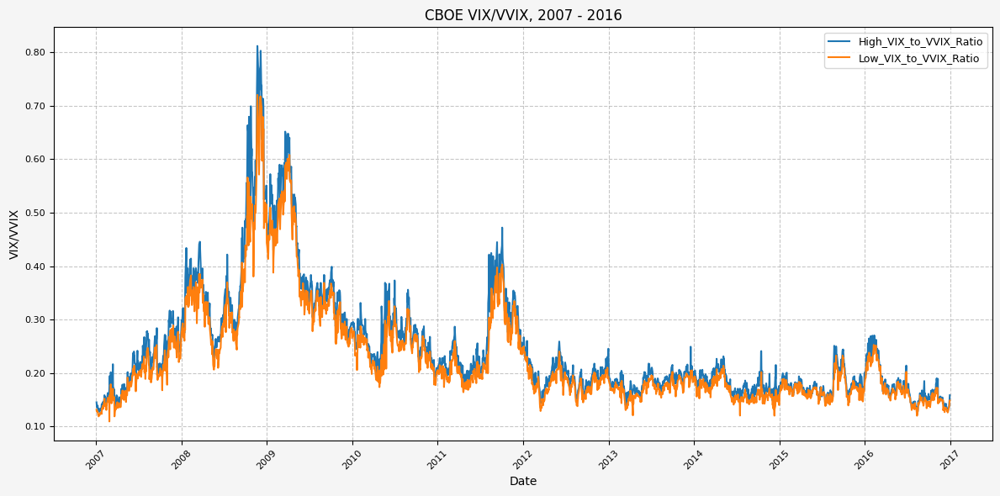

In [70]:
plot_timeseries(
    price_df=vix_over_vvix,
    plot_start_date=None,
    plot_end_date="2016-12-31",
    plot_columns=["High_VIX_to_VVIX_Ratio", "Low_VIX_to_VVIX_Ratio"],
    title="CBOE VIX/VVIX, 2007 - 2016",
    x_label="Date",
    x_format="Year",
    y_label="VIX/VVIX",
    y_format="Decimal",
    y_format_decimal_places=2,
    y_tick_spacing=0.10,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="03_VIX_Over_VVIX_Plot_2007-2016",
)

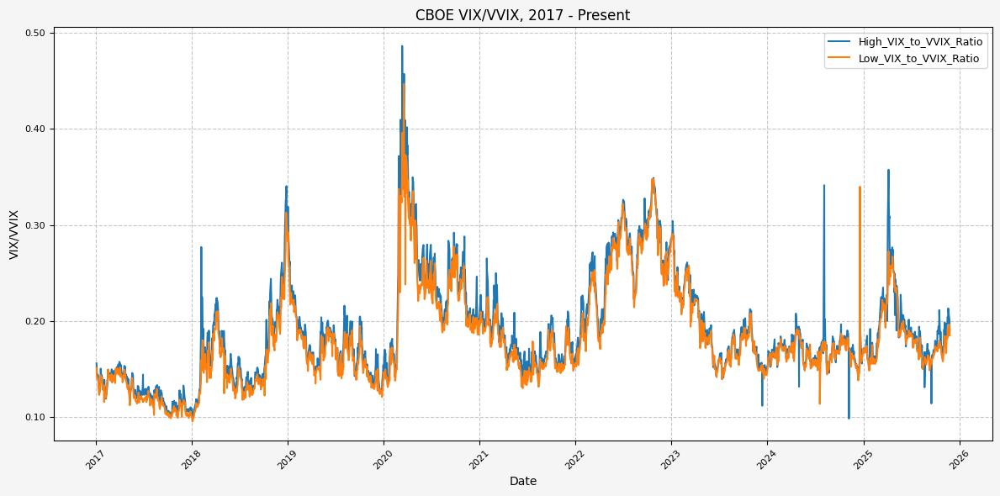

In [71]:
plot_timeseries(
    price_df=vix_over_vvix,
    plot_start_date="2017-01-01",
    plot_end_date=None,
    plot_columns=["High_VIX_to_VVIX_Ratio", "Low_VIX_to_VVIX_Ratio"],
    title="CBOE VIX/VVIX, 2017 - Present",
    x_label="Date",
    x_format="Year",
    y_label="VIX/VVIX",
    y_format="Decimal",
    y_format_decimal_places=2,
    y_tick_spacing=0.10,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="03_VIX_Over_VVIX_Plot_2017-Present",
)

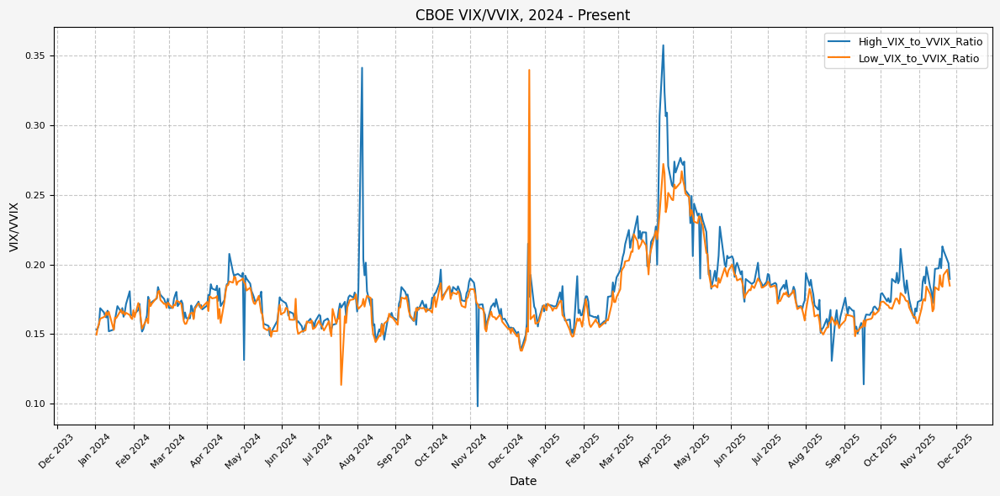

In [72]:
plot_timeseries(
    price_df=vix_over_vvix,
    plot_start_date="2024-01-01",
    plot_end_date=None,
    plot_columns=["High_VIX_to_VVIX_Ratio", "Low_VIX_to_VVIX_Ratio"],
    title="CBOE VIX/VVIX, 2024 - Present",
    x_label="Date",
    x_format="Month",
    y_label="VIX/VVIX",
    y_format="Decimal",
    y_format_decimal_places=2,
    y_tick_spacing=0.05,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="03_VIX_Over_VVIX_Plot_2024-Present",
)

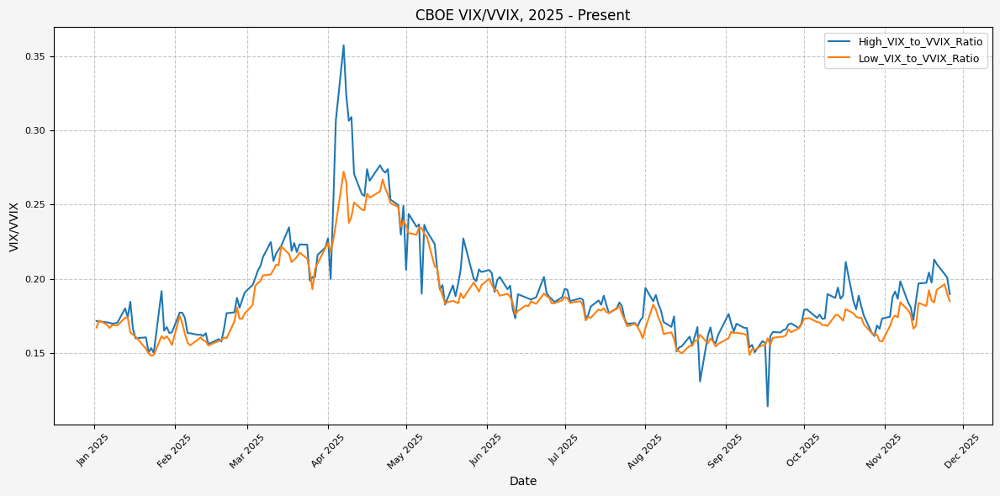

In [73]:
plot_timeseries(
    price_df=vix_over_vvix,
    plot_start_date="2025-01-01",
    plot_end_date=None,
    plot_columns=["High_VIX_to_VVIX_Ratio", "Low_VIX_to_VVIX_Ratio"],
    title="CBOE VIX/VVIX, 2025 - Present",
    x_label="Date",
    x_format="Month",
    y_label="VIX/VVIX",
    y_format="Decimal",
    y_format_decimal_places=2,
    y_tick_spacing=0.05,
    grid=True,
    legend=True,
    export_plot=True,
    plot_file_name="03_VIX_Over_VVIX_Plot_2025-Present",
)

### Stats By Year - VIX/VVIX

In [74]:
# plot_stats(
#     stats_df=vvix_stats_by_year,
#     plot_columns=["Open_mean", "High_mean", "Low_mean", "Close_mean"],
#     title="VVIX Mean OHLC By Year",
#     x_label="Year",
#     x_rotation=45,
#     x_tick_spacing=1,
#     y_label="Price",
#     y_tick_spacing=5,
#     grid=True,
#     legend=True,
#     export_plot=True,
#     plot_file_name="02_VVIX_Stats_By_Year"
# )

### Stats By Month - VIX/VVIX

In [75]:
# plot_stats(
#     stats_df=vvix_stats_by_month,
#     plot_columns=["Open_mean", "High_mean", "Low_mean", "Close_mean"],
#     title="VVIX Mean OHLC By Month",
#     x_label="Month",
#     x_rotation=0,
#     x_tick_spacing=1,
#     y_label="Price",
#     y_tick_spacing=1,
#     grid=True,
#     legend=True,
#     export_plot=True,
#     plot_file_name="02_VVIX_Stats_By_Month"
# )

## Investigating A Signal

### Determining A Spike Level

In [76]:
# Define the spike multiplier for detecting significant spikes
spike_level = 1.25

# =========================
# Simple Moving Averages (SMA)
# =========================

# Calculate 10-period SMA of 'High'
vix['High_SMA_10'] = vix['High'].rolling(window=10).mean()

# Shift the 10-period SMA by 1 to compare with current 'High'
vix['High_SMA_10_Shift'] = vix['High_SMA_10'].shift(1)

# Calculate the spike level based on shifted SMA and spike multiplier
vix['Spike_Level_SMA'] = vix['High_SMA_10_Shift'] * spike_level

# Calculate 20-period SMA of 'High'
vix['High_SMA_20'] = vix['High'].rolling(window=20).mean()

# Determine if 'High' exceeds the spike level (indicates a spike)
vix['Spike_SMA'] = vix['High'] >= vix['Spike_Level_SMA']

# Calculate 50-period SMA of 'High' for trend analysis
vix['High_SMA_50'] = vix['High'].rolling(window=50).mean()

# =========================
# Exponential Moving Averages (EMA)
# =========================

# Calculate 10-period EMA of 'High'
vix['High_EMA_10'] = vix['High'].ewm(span=10, adjust=False).mean()

# Shift the 10-period EMA by 1 to compare with current 'High'
vix['High_EMA_10_Shift'] = vix['High_EMA_10'].shift(1)

# Calculate the spike level based on shifted EMA and spike multiplier
vix['Spike_Level_EMA'] = vix['High_EMA_10_Shift'] * spike_level

# Calculate 20-period EMA of 'High'
vix['High_EMA_20'] = vix['High'].ewm(span=20, adjust=False).mean()

# Determine if 'High' exceeds the spike level (indicates a spike)
vix['Spike_EMA'] = vix['High'] >= vix['Spike_Level_EMA']

# Calculate 50-period EMA of 'High' for trend analysis
vix['High_EMA_50'] = vix['High'].ewm(span=50, adjust=False).mean()

In [77]:
display(vix)

,Close,High,Low,Open,High_SMA_10,High_SMA_10_Shift,Spike_Level_SMA,High_SMA_20,Spike_SMA,High_SMA_50,High_EMA_10,High_EMA_10_Shift,Spike_Level_EMA,High_EMA_20,Spike_EMA,High_EMA_50
Date,,,,,,,,,,,,,,,,
1990-01-02,17.24,17.24,17.24,17.24,NaN,NaN,NaN,NaN,False,NaN,17.24,NaN,NaN,17.24,False,17.24
1990-01-03,18.19,18.19,18.19,18.19,NaN,NaN,NaN,NaN,False,NaN,17.41,17.24,21.55,17.33,False,17.28
1990-01-04,19.22,19.22,19.22,19.22,NaN,NaN,NaN,NaN,False,NaN,17.74,17.41,21.77,17.51,False,17.35
1990-01-05,20.11,20.11,20.11,20.11,NaN,NaN,NaN,NaN,False,NaN,18.17,17.74,22.18,17.76,False,17.46
1990-01-08,20.26,20.26,20.26,20.26,NaN,NaN,NaN,NaN,False,NaN,18.55,18.17,22.71,18.00,False,17.57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-11-20,26.42,28.27,19.28,20.78,22.43,21.63,27.04,20.36,True,19.30,23.36,22.27,27.83,21.74,True,19.99
2025-11-21,23.43,27.84,22.54,25.97,22.94,22.43,28.04,20.90,False,19.56,24.17,23.36,29.20,22.32,False,20.30
2025-11-24,20.52,23.68,20.41,22.69,23.43,22.94,28.68,21.28,False,19.72,24.08,24.17,30.22,22.45,False,20.43


In [78]:
vix[vix['High'] >= 50]

,Close,High,Low,Open,High_SMA_10,High_SMA_10_Shift,Spike_Level_SMA,High_SMA_20,Spike_SMA,High_SMA_50,High_EMA_10,High_EMA_10_Shift,Spike_Level_EMA,High_EMA_20,Spike_EMA,High_EMA_50
Date,,,,,,,,,,,,,,,,
2008-10-06,52.05,58.24,45.12,45.12,42.92,40.52,50.65,37.24,True,28.17,44.33,41.24,51.55,38.82,True,31.65
2008-10-07,53.68,54.19,47.03,52.05,44.73,42.92,53.65,38.66,True,28.76,46.12,44.33,55.41,40.29,False,32.53
2008-10-08,57.53,59.06,51.90,53.68,46.97,44.73,55.91,40.34,True,29.46,48.47,46.12,57.65,42.07,True,33.57
2008-10-09,63.92,64.92,52.54,57.57,49.94,46.97,58.71,42.27,True,30.31,51.46,48.47,60.59,44.25,True,34.80
2008-10-10,69.95,76.94,65.63,65.85,53.99,49.94,62.42,44.79,True,31.39,56.10,51.46,64.33,47.36,True,36.46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08-05,38.57,65.73,23.39,23.39,23.84,18.95,23.69,19.11,True,15.66,28.04,19.66,24.58,22.15,True,17.62
2025-04-07,46.98,60.13,38.58,60.13,28.60,24.51,30.63,26.10,True,22.35,33.61,27.72,34.65,28.48,True,23.95
2025-04-08,52.33,57.52,36.48,44.04,32.58,28.60,35.76,27.50,True,23.05,37.96,33.61,42.01,31.25,True,25.27


### Spike Counts (Signals) By Year

In [79]:
# Ensure the index is a DatetimeIndex
vix.index = pd.to_datetime(vix.index)

# Create a new column for the year extracted from the date index
vix['Year'] = vix.index.year

# Group by year and the "Spike_SMA" and "Spike_EMA" columns, then count occurrences
spike_count_SMA = vix.groupby(['Year', 'Spike_SMA']).size().unstack(fill_value=0)

display(spike_count_SMA)

Spike_SMA,False,True
Year,,
1990,248,5
1991,249,4
1992,250,4
1993,251,2
1994,243,9
1995,252,0
1996,248,6
1997,247,6
1998,243,9


In [80]:
# Copy this <!-- INSERT_08_Spike_Counts_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="08_Spike_Counts.md", content=spike_count_SMA.to_markdown())

✅ Exported and tracked: 08_Spike_Counts.md


In [81]:
# Ensure the index is a DatetimeIndex
vix.index = pd.to_datetime(vix.index)

# Create a new column for the year extracted from the date index
vix['Year'] = vix.index.year

# Group by year and the "Spike_SMA" and "Spike_EMA" columns, then count occurrences
spike_count_EMA = vix.groupby(['Year', 'Spike_EMA']).size().unstack(fill_value=0)

display(spike_count_EMA)

Spike_EMA,False,True
Year,,
1990,247,6
1991,251,2
1992,253,1
1993,251,2
1994,247,5
1995,252,0
1996,252,2
1997,250,3
1998,246,6


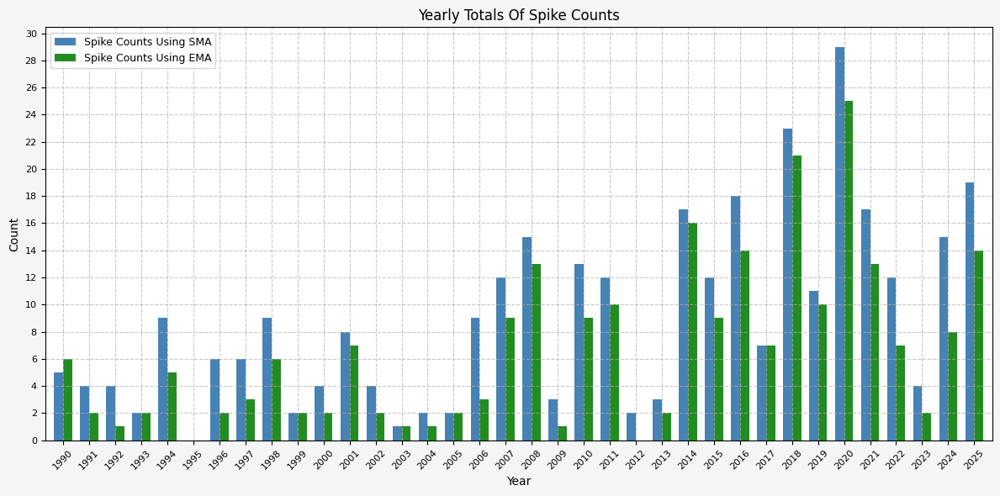

In [82]:
# Plotting
plt.figure(figsize=(12, 6), facecolor="#F5F5F5")

# Bar positions
x = np.arange(len(spike_count_SMA[True].index))
width = 0.35

# Plot SMA bars
plt.bar(x - width / 2, spike_count_SMA[True].values, width, color="steelblue", label="Spike Counts Using SMA")

# Plot EMA bars
plt.bar(x + width / 2, spike_count_EMA[True].values, width, color="forestgreen", label="Spike Counts Using EMA")

# Set X axis
# x_tick_spacing = 5  # Specify the interval for y-axis ticks
# plt.gca().xaxis.set_major_locator(MultipleLocator(x_tick_spacing))
plt.xlabel("Year", fontsize=10)
plt.xticks(x, spike_count_SMA[True].index, rotation=45, fontsize=8)
plt.xlim(x[0] - 2 * width, x[-1] + 2 * width)

# # Set Y axis
y_tick_spacing = 2  # Specify the interval for y-axis ticks
plt.gca().yaxis.set_major_locator(MultipleLocator(y_tick_spacing))
plt.ylabel("Count", fontsize=10)
plt.yticks(fontsize=8)

# Set title, layout, grid, and legend
plt.title("Yearly Totals Of Spike Counts", fontsize=12)
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=9)

# Save figure and display plot
plt.savefig("08_Spike_Counts.png", dpi=300, bbox_inches="tight")
plt.show()

### Spike Counts (Signals) Plots By Year

In [83]:
def vix_plot(start_year, end_year):
    # Start and end dates
    start_date = start_year + '-01-01'
    end_date = end_year + '-12-31'

    # Create temporary dataframe for the specified date range
    vix_temp = vix[(vix.index >= start_date) & (vix.index <= end_date)]

    # Plotting
    plt.figure(figsize=(12, 6), facecolor="#F5F5F5")

    # Plot data
    plt.plot(vix_temp.index, vix_temp['High'], label='High', linestyle='-', color='steelblue', linewidth=1)
    plt.plot(vix_temp.index, vix_temp['Low'], label='Low', linestyle='-', color='brown', linewidth=1)
    plt.plot(vix_temp.index, vix_temp['High_SMA_10'], label='10 Day High SMA', linestyle='-', color='red', linewidth=1)
    plt.plot(vix_temp.index, vix_temp['High_SMA_20'], label='20 Day High SMA', linestyle='-', color='orange', linewidth=1)
    plt.plot(vix_temp.index, vix_temp['High_SMA_50'], label='50 Day High SMA', linestyle='-', color='green', linewidth=1)
    plt.scatter(vix_temp[vix_temp['Spike_SMA'] == True].index, vix_temp[vix_temp['Spike_SMA'] == True]['High'], label='Spike (High > 1.25 * 10 Day High SMA)', linestyle='-', color='black', s=20)

    # Set X axis
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    plt.xlabel("Date", fontsize=10)
    plt.xticks(rotation=45, fontsize=8)

    # Set Y axis
    y_tick_spacing = 5  # Specify the interval for y-axis ticks
    plt.gca().yaxis.set_major_locator(MultipleLocator(y_tick_spacing))
    plt.ylabel("VIX", fontsize=10)
    plt.yticks(fontsize=8)

    # Set title, layout, grid, and legend
    plt.title(f"CBOE Volatility Index (VIX), {start_year} - {end_year}", fontsize=12)
    plt.tight_layout()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(fontsize=9)

    # Save figure and display plot
    plt.savefig(f"09_VIX_SMA_Spike_{start_year}_{end_year}.png", dpi=300, bbox_inches="tight")
    plt.show()

#### Yearly Plots

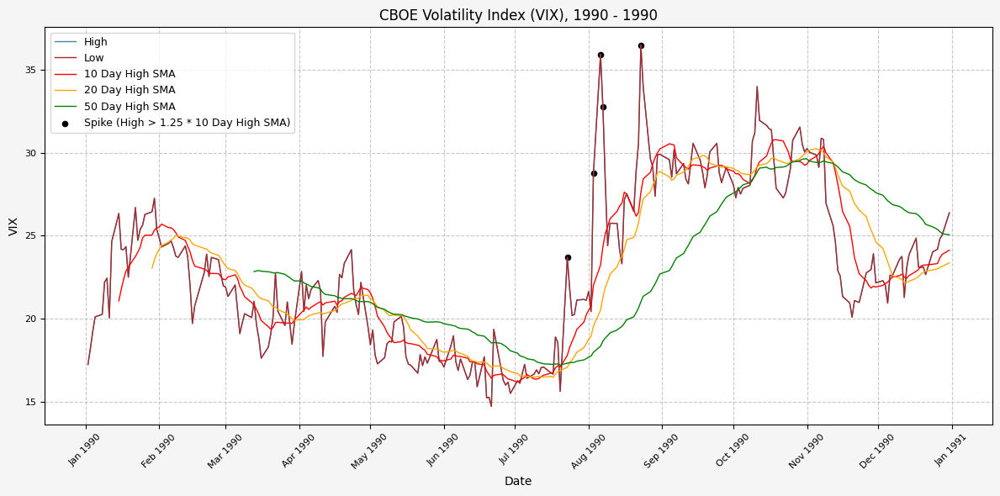

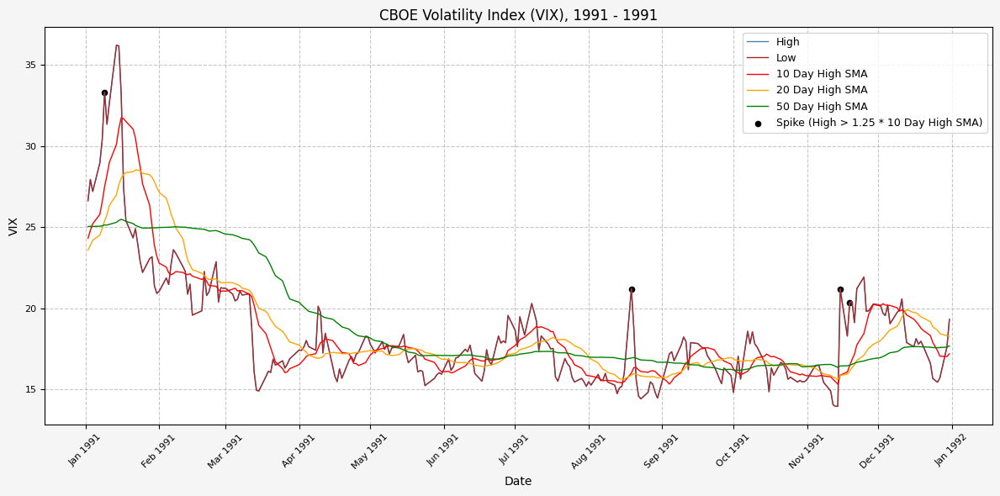

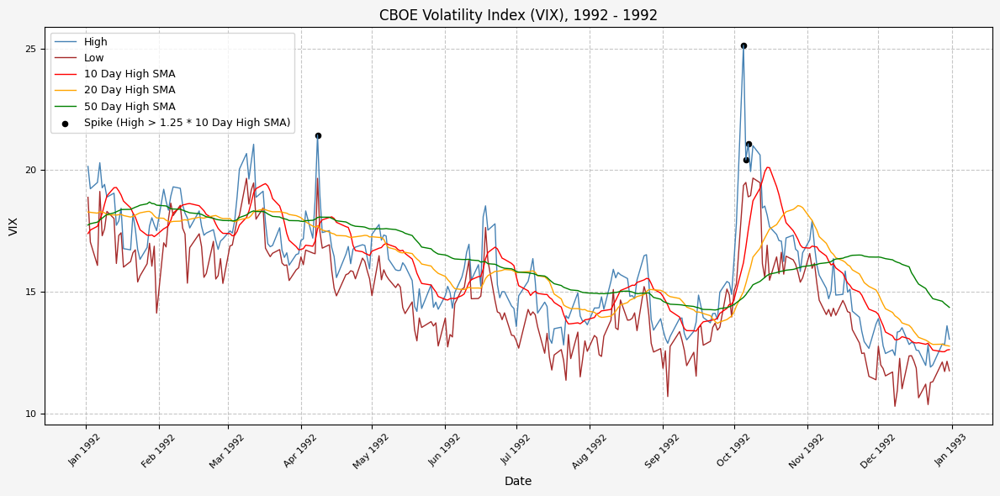

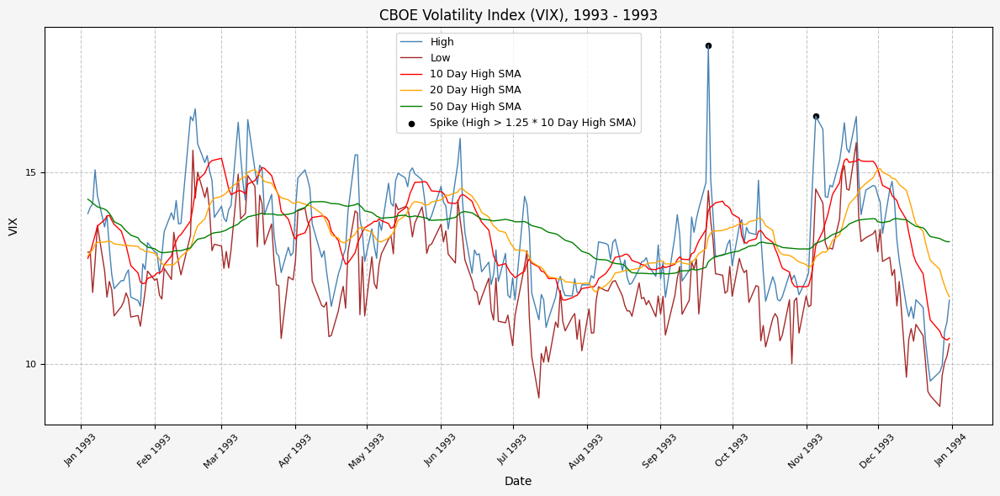

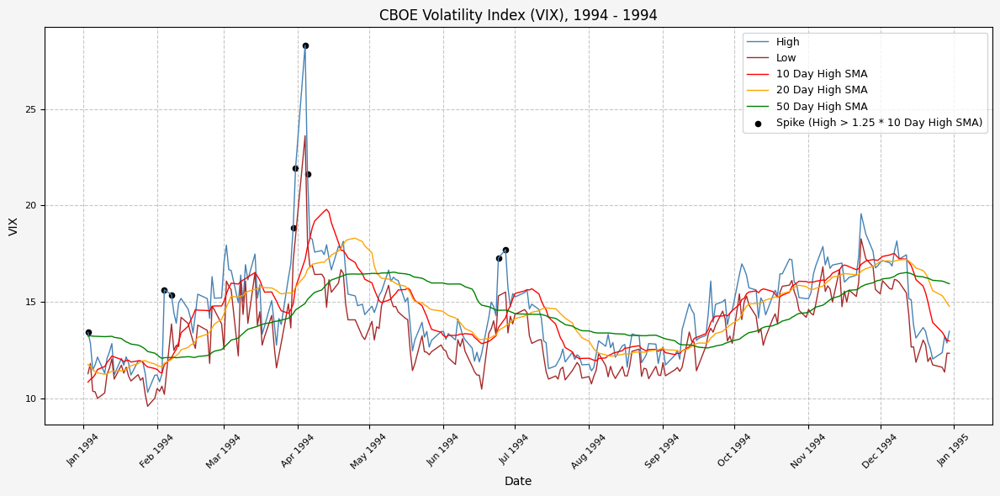

...

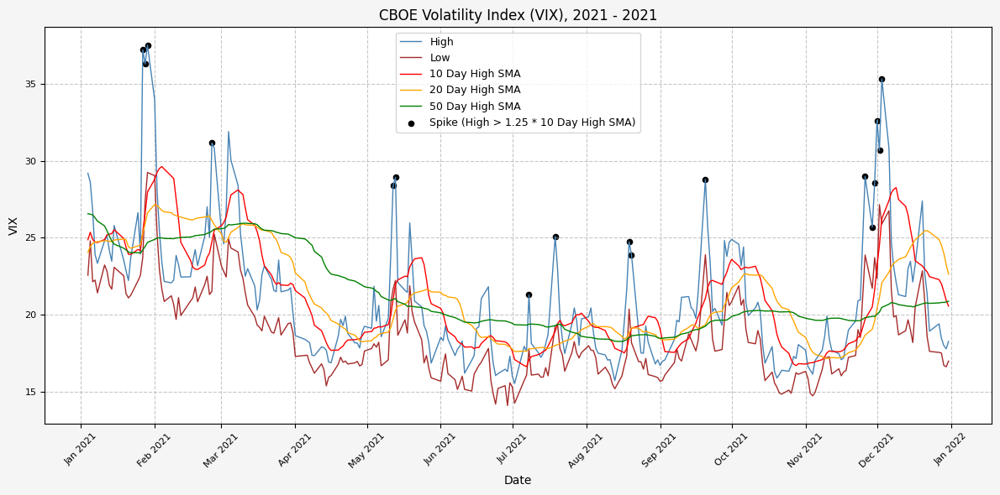

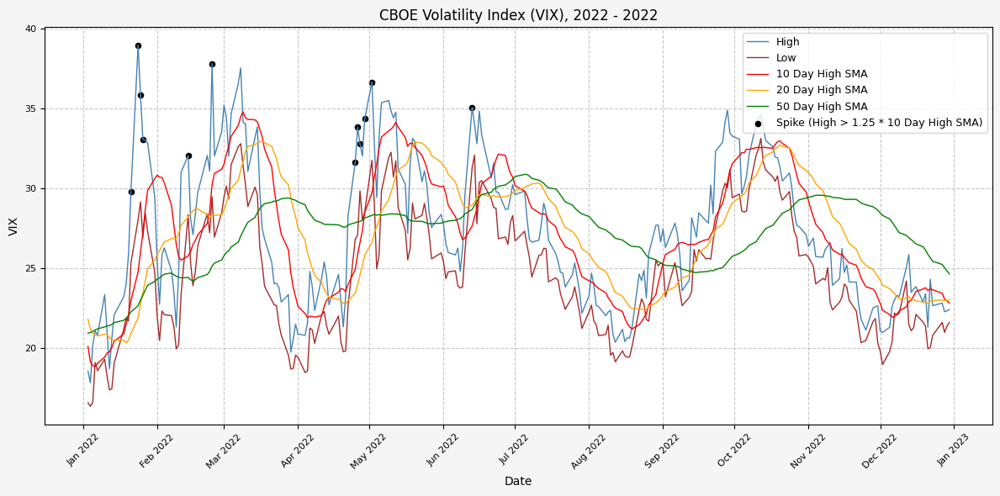

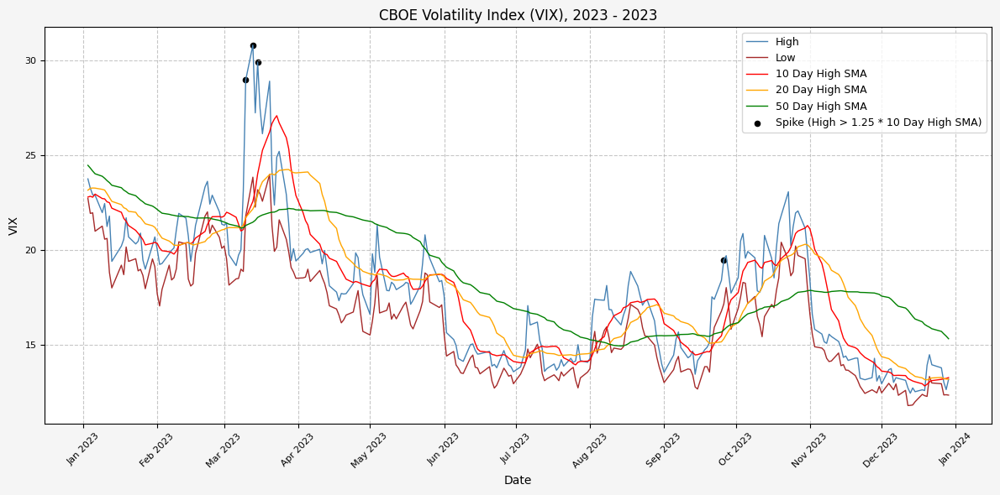

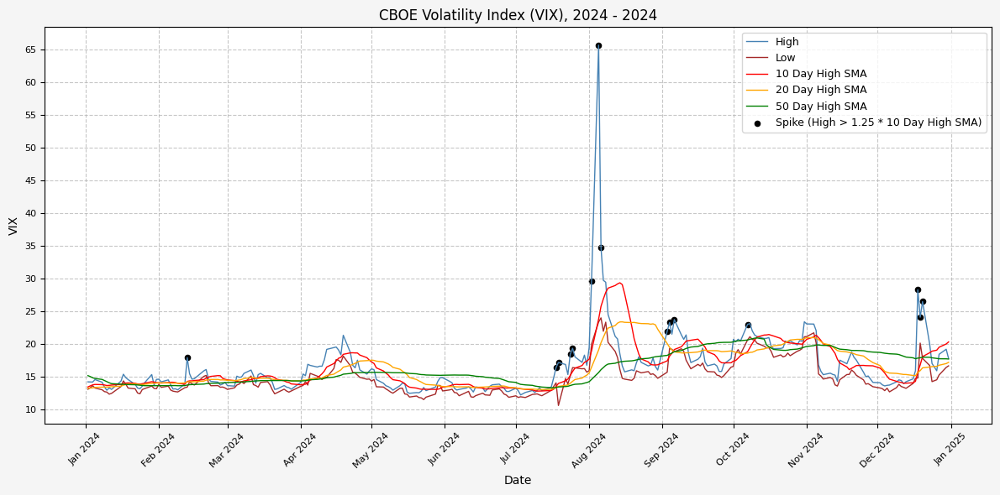

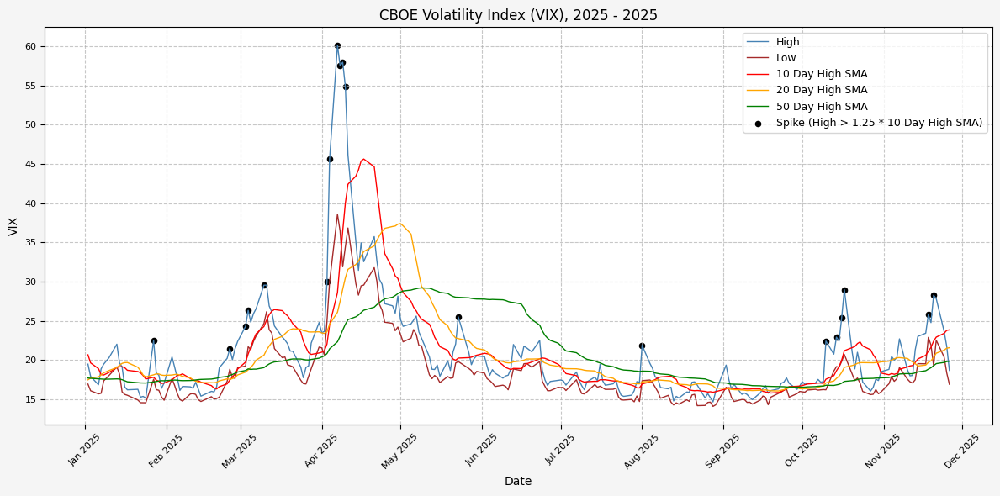

In [84]:
for year in range(1990, 2026):
    vix_plot(str(year), str(year))

### Spike Counts (Signals) Plots By Decade

#### 1990 - 1994

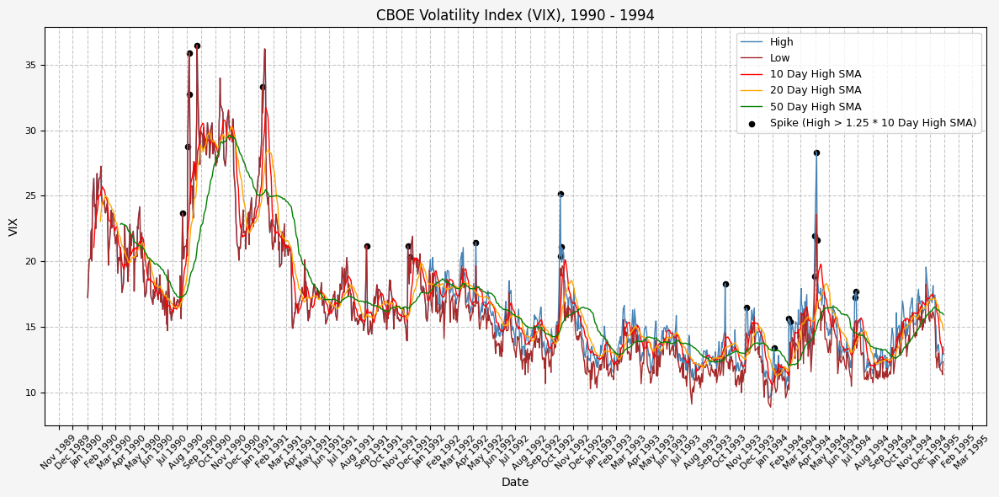

In [85]:
vix_plot('1990', '1994')

#### 1995 - 1999

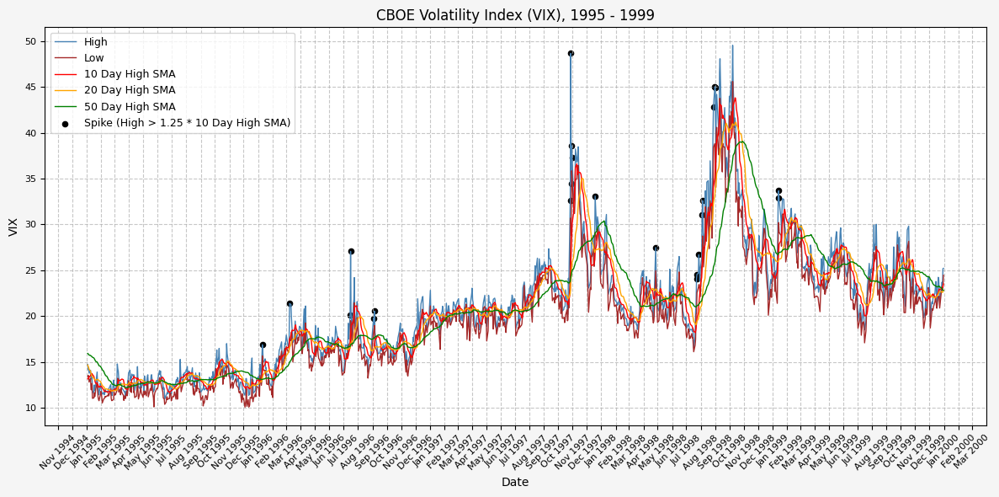

In [86]:
vix_plot('1995', '1999')

#### 2000 - 2004

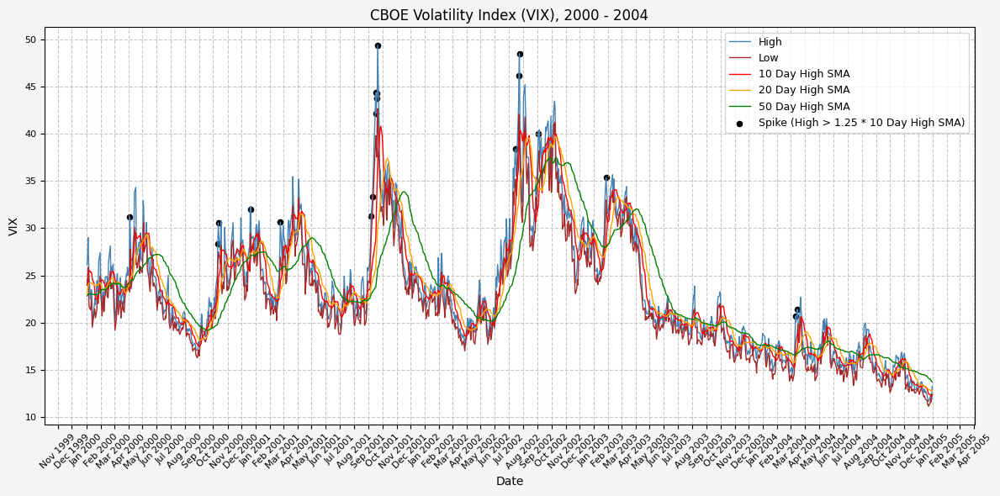

In [87]:
vix_plot('2000', '2004')

#### 2005 - 2009

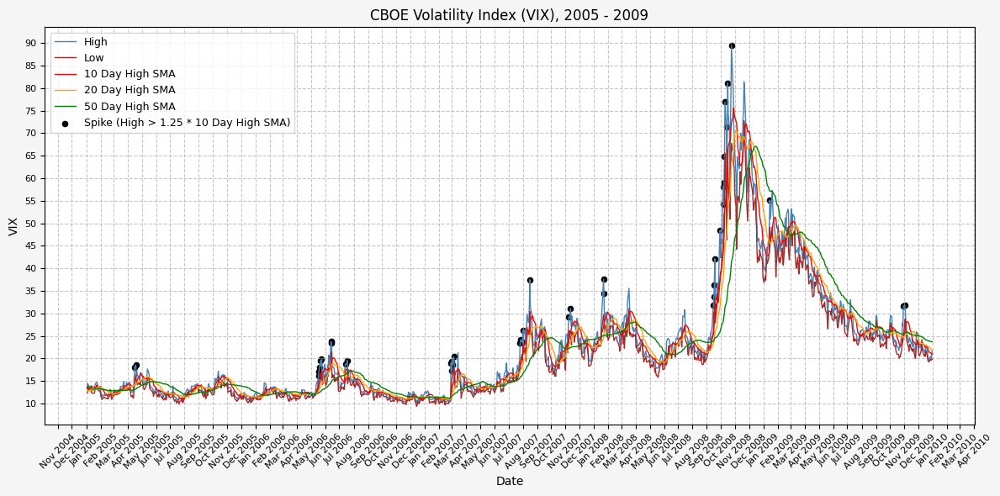

In [88]:
vix_plot('2005', '2009')

#### 2010 - 2014

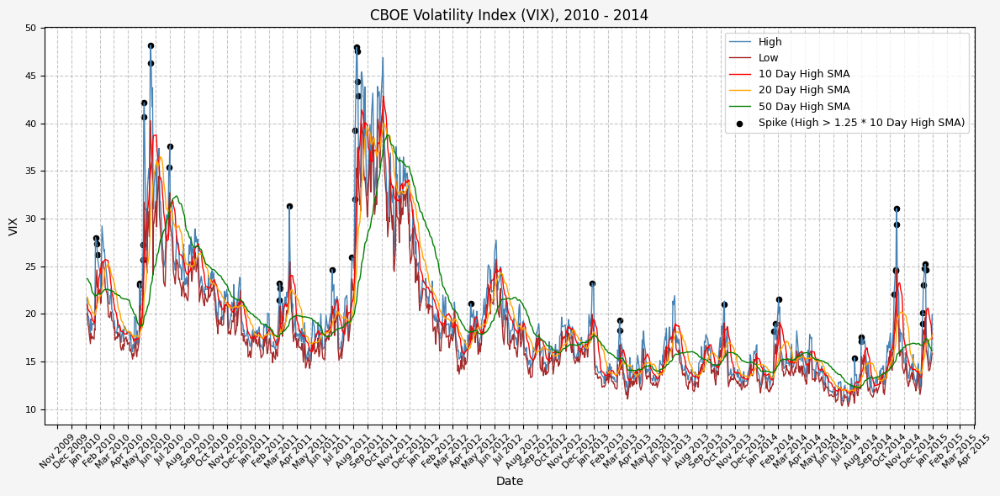

In [89]:
vix_plot('2010', '2014')

#### 2015 - 2019

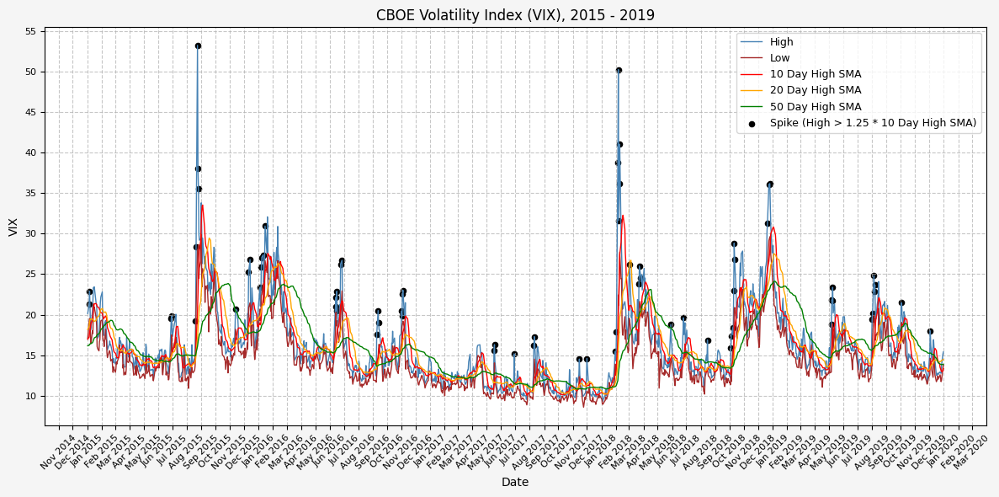

In [90]:
vix_plot('2015', '2019')

#### 2020 - 2024

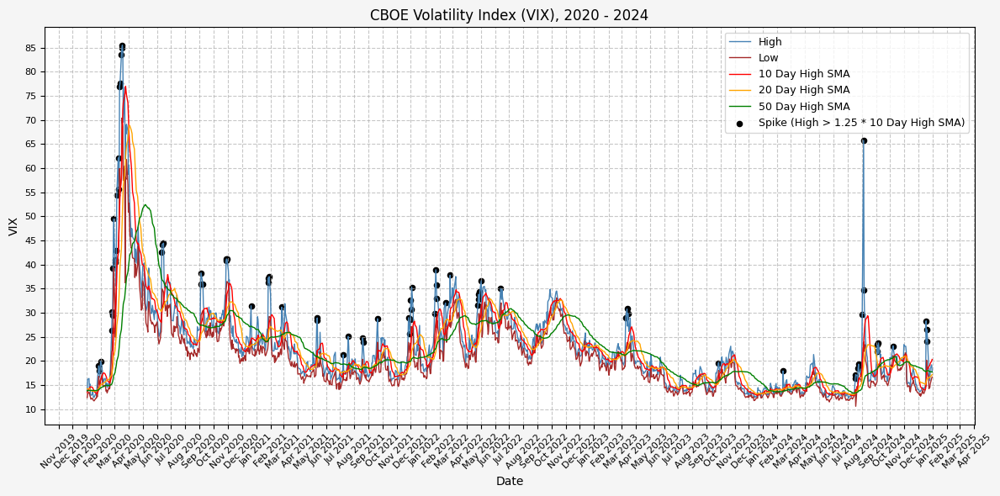

In [91]:
vix_plot('2020', '2024')

#### 2025 - Present

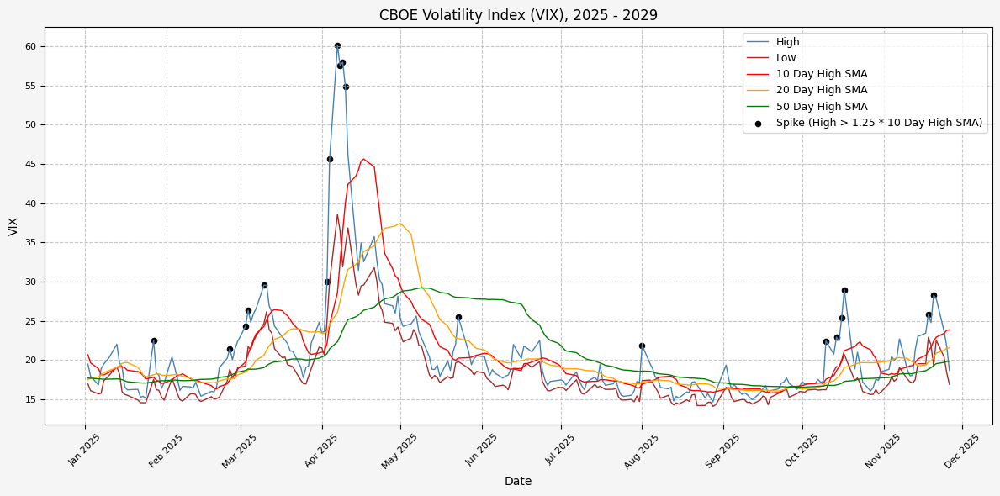

In [92]:
vix_plot('2025', '2029')

## Trading History

### Trades Executed

In [93]:
# from schwab_order_history import schwab_order_history

In [94]:
# from datetime import datetime
# import pandas as pd

# # Define your date ranges
# range_2024 = {
#     "from": "2024-01-01T00:00:00.000Z",
#     "to": "2024-12-31T23:59:59.000Z",
# }

# range_2025 = {
#     "from": "2025-01-01T00:00:00.000Z",
#     "to": datetime.utcnow().strftime("%Y-%m-%dT%H:%M:%S.000Z"),
# }

# # Pull both sets of orders
# df_2024 = schwab_order_history(
#     max_results=1000,  # or whatever large number you want
#     from_entered_time=range_2024["from"],
#     to_entered_time=range_2024["to"],
#     account_id=None,  # or pass your specific encrypted account ID
# )

# df_2025 = schwab_order_history(
#     max_results=1000,
#     from_entered_time=range_2025["from"],
#     to_entered_time=range_2025["to"],
#     account_id=None,
# )

# # Combine the two dataframes
# df_all = pd.concat([df_2024, df_2025], ignore_index=True)


In [95]:
# df_2024

In [96]:
# # Filter for symbols that start with "VIX"
# df_vix = df_all[df_all["symbol"].str.startswith("VIX")].copy()
# df_vix = df_vix.sort_values(by=['symbol', 'execution_time'], ascending=[True, True])

In [97]:
# df_vix

### Trades Executed

In [98]:
# Import CSV file of VIX transactions from IRA and Brokerage accounts
vix_transactions_IRA = pd.read_csv(DATA_MANUAL_DIR / "VIX_Transactions_IRA.csv")
vix_transactions_Brokerage = pd.read_excel(DATA_MANUAL_DIR / "VIX_Transactions_Brokerage.xlsx", sheet_name="VIX_Transactions_Brokerage")

In [99]:
# Combine the two DataFrames
vix_transactions = pd.concat([vix_transactions_IRA, vix_transactions_Brokerage], ignore_index=True)

# Drop unnecessary columns
vix_transactions.drop(columns = {'Description'}, inplace=True)

# Convert Amount, Price, and Fees & Comm columns to numeric
vix_transactions['Amount'] = vix_transactions['Amount'].replace({'\$': '', ',': ''}, regex=True).astype(float)
vix_transactions['Price'] = vix_transactions['Price'].replace({'\$': '', ',': ''}, regex=True).astype(float)
vix_transactions['Fees & Comm'] = vix_transactions['Fees & Comm'].replace({'\$': '', ',': ''}, regex=True).astype(float)

# Convert Amount column to absolute values
vix_transactions['Amount'] = abs(vix_transactions['Amount'])

# Extract date for option expiration with regex (MM/DD/YYYY)
vix_transactions["Exp_Date"] = vix_transactions["Symbol"].str.extract(r'(\d{2}/\d{2}/\d{4})')

# Extract date for option strike price with regex and convert to float
vix_transactions["Strike_Price"] = vix_transactions["Symbol"].str.extract(r'(\d{2}\.\d{2})').astype(float)

# Convert expiration date and trade date to datetime
vix_transactions["Exp_Date"] = pd.to_datetime(vix_transactions["Exp_Date"], format="%m/%d/%Y")
vix_transactions['Date'] = pd.to_datetime(vix_transactions['Date'])

# Rename date to trade date
vix_transactions.rename(columns={'Date': 'Trade_Date'}, inplace=True)

# Sort by Exp_Date, then Strike_Price, then Trade_Date
vix_transactions.sort_values(by=['Exp_Date', 'Strike_Price', 'Trade_Date'], ascending=[True, True, True], inplace=True)

# Reset index
vix_transactions.reset_index(drop=True, inplace=True)
vix_transactions

,Trade_Date,Action,Symbol,Quantity,Price,Fees & Comm,Amount,Approx_VIX_Level,Comments,Exp_Date,Strike_Price
0,2024-08-05,Buy to Open,VIX 09/18/2024 34.00 P,1,10.95,1.08,1096.08,34.33,NaN,2024-09-18,34.00
1,2024-08-21,Sell to Close,VIX 09/18/2024 34.00 P,1,17.95,1.08,1793.92,16.50,NaN,2024-09-18,34.00
2,2024-08-05,Buy to Open,VIX 10/16/2024 40.00 P,1,16.35,1.08,1636.08,42.71,NaN,2024-10-16,40.00
3,2024-09-18,Sell to Close,VIX 10/16/2024 40.00 P,1,21.54,1.08,2152.92,18.85,NaN,2024-10-16,40.00
4,2024-08-07,Buy to Open,VIX 11/20/2024 25.00 P,2,5.90,2.16,1182.16,27.11,NaN,2024-11-20,25.00
...,...,...,...,...,...,...,...,...,...,...,...
59,2025-10-09,Sell to Close,VIX 11/19/2025 20.00 C,10,2.08,10.81,2069.19,NaN,NaN,2025-11-19,20.00
60,2025-08-12,Buy to Open,VIX 11/19/2025 21.00 C,10,3.00,10.81,3010.81,15.17,NaN,2025-11-19,21.00
61,2025-10-08,Sell to Close,VIX 11/19/2025 21.00 C,10,1.83,9.31,1820.69,NaN,NaN,2025-11-19,21.00
62,2025-09-11,Buy to Open,VIX 12/17/2025 17.00 C,10,3.90,10.81,3910.81,NaN,NaN,2025-12-17,17.00


In [100]:
vix_transactions_no_exp = vix_transactions.drop(columns=['Exp_Date', 'Strike_Price'])
vix_transactions_no_exp

,Trade_Date,Action,Symbol,Quantity,Price,Fees & Comm,Amount,Approx_VIX_Level,Comments
0,2024-08-05,Buy to Open,VIX 09/18/2024 34.00 P,1,10.95,1.08,1096.08,34.33,NaN
1,2024-08-21,Sell to Close,VIX 09/18/2024 34.00 P,1,17.95,1.08,1793.92,16.50,NaN
2,2024-08-05,Buy to Open,VIX 10/16/2024 40.00 P,1,16.35,1.08,1636.08,42.71,NaN
3,2024-09-18,Sell to Close,VIX 10/16/2024 40.00 P,1,21.54,1.08,2152.92,18.85,NaN
4,2024-08-07,Buy to Open,VIX 11/20/2024 25.00 P,2,5.90,2.16,1182.16,27.11,NaN
...,...,...,...,...,...,...,...,...,...
59,2025-10-09,Sell to Close,VIX 11/19/2025 20.00 C,10,2.08,10.81,2069.19,NaN,NaN
60,2025-08-12,Buy to Open,VIX 11/19/2025 21.00 C,10,3.00,10.81,3010.81,15.17,NaN
61,2025-10-08,Sell to Close,VIX 11/19/2025 21.00 C,10,1.83,9.31,1820.69,NaN,NaN
62,2025-09-11,Buy to Open,VIX 12/17/2025 17.00 C,10,3.90,10.81,3910.81,NaN,NaN


In [101]:
# Copy this <!-- INSERT_10_Trades_Executed_HERE --> to index_temp.md
export_track_md_deps(dep_file=dep_file, md_filename="10_Trades_Executed.md", content=vix_transactions_no_exp.to_markdown(index=False, floatfmt=".2f"))

✅ Exported and tracked: 10_Trades_Executed.md


#### Volatility In August 2024

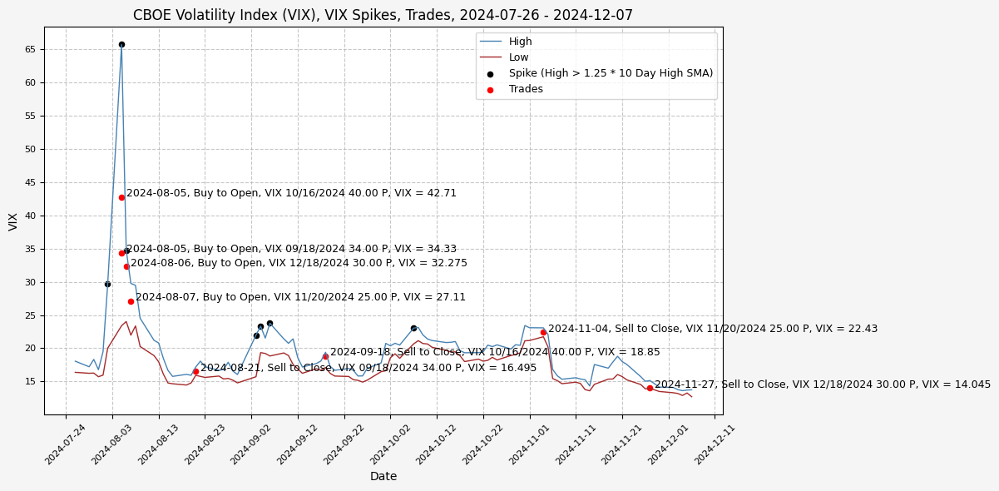

<!-- INSERT_11_Closed_Positions_HERE -->
<!-- INSERT_11_Open_Positions_HERE -->
<!-- INSERT_11_Total_Opened_Position_Market_Value_HERE -->
<!-- INSERT_11_Total_Closed_Position_Market_Value_HERE -->
<!-- INSERT_11_PnL_HERE -->
<!-- INSERT_11_Percent_PnL_HERE -->
✅ Exported and tracked: 11_Closed_Positions.md
✅ Exported and tracked: 11_Open_Positions.md
✅ Exported and tracked: 11_Total_Opened_Position_Market_Value.txt
✅ Exported and tracked: 11_Total_Closed_Position_Market_Value.txt
✅ Exported and tracked: 11_PnL.txt
✅ Exported and tracked: 11_Percent_PnL.txt


In [102]:
# Variables to be modifed
esd = "2024-09-18" # Expiration Start Date
eed = "2024-12-18" # Expiration End Date
tsd = "2024-08-05" # Trade Start Date
ted = "2024-11-27" # Trade End Date
index_number = "11"
x_tick_spacing = 10
y_tick_spacing = 5

############################################
## Do not modify the code below this line ##
############################################

trades, closed_pos, open_pos, per_pnl, pnl, tot_opened_pos_mkt_val, tot_closed_pos_mkt_val = calc_vix_trade_pnl(
    transaction_df=vix_transactions,
    exp_start_date=esd,
    exp_end_date=eed,
    trade_start_date=tsd,
    trade_end_date=ted,
)

# Convert to datetime objects
tsd_dt = datetime.strptime(tsd, "%Y-%m-%d")
ted_dt = datetime.strptime(ted, "%Y-%m-%d")

# Adjust the plot start and end dates
plot_start = tsd_dt - timedelta(days=10)
plot_end = ted_dt + timedelta(days=10)

plot_vix_with_trades(
    vix_price_df=vix,
    trades_df=trades,
    plot_start_date=plot_start.strftime("%Y-%m-%d"),
    plot_end_date=plot_end.strftime("%Y-%m-%d"),
    x_tick_spacing=x_tick_spacing,
    y_tick_spacing=y_tick_spacing,
    index_number=index_number,
    export_plot=True,
)

print(f"<!-- INSERT_{index_number}_Closed_Positions_HERE -->")
print(f"<!-- INSERT_{index_number}_Open_Positions_HERE -->")
print(f"<!-- INSERT_{index_number}_Total_Opened_Position_Market_Value_HERE -->")
print(f"<!-- INSERT_{index_number}_Total_Closed_Position_Market_Value_HERE -->")
print(f"<!-- INSERT_{index_number}_PnL_HERE -->")
print(f"<!-- INSERT_{index_number}_Percent_PnL_HERE -->")
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Closed_Positions.md", content=closed_pos.to_markdown(index=False, floatfmt=".2f"))
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Open_Positions.md", content=open_pos.to_markdown(index=False, floatfmt=".2f"))
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Total_Opened_Position_Market_Value.txt", content=tot_opened_pos_mkt_val)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Total_Closed_Position_Market_Value.txt", content=tot_closed_pos_mkt_val)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_PnL.txt", content=pnl)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Percent_PnL.txt", content=per_pnl)

#### Volatility In March 2025

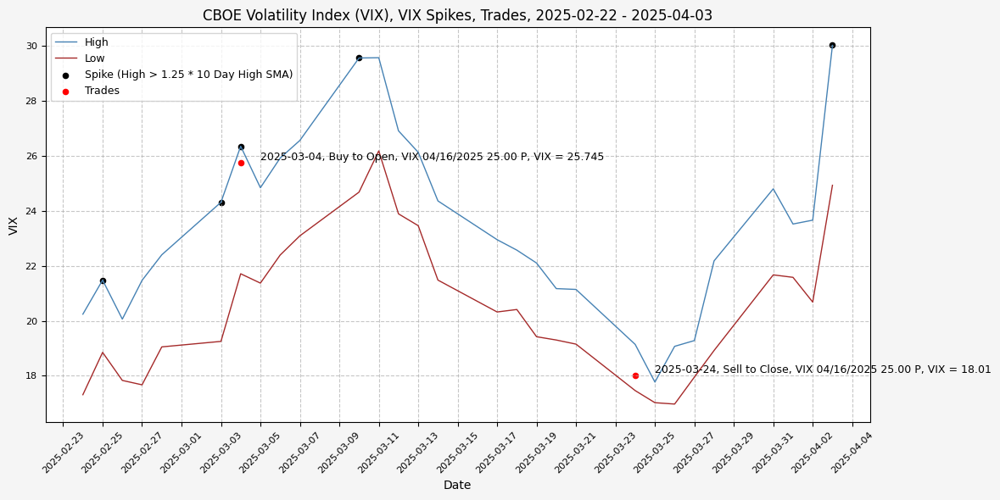

<!-- INSERT_12_Closed_Positions_HERE -->
<!-- INSERT_12_Open_Positions_HERE -->
<!-- INSERT_12_Total_Opened_Position_Market_Value_HERE -->
<!-- INSERT_12_Total_Closed_Position_Market_Value_HERE -->
<!-- INSERT_12_PnL_HERE -->
<!-- INSERT_12_Percent_PnL_HERE -->
✅ Exported and tracked: 12_Closed_Positions.md
✅ Exported and tracked: 12_Open_Positions.md
✅ Exported and tracked: 12_Total_Opened_Position_Market_Value.txt
✅ Exported and tracked: 12_Total_Closed_Position_Market_Value.txt
✅ Exported and tracked: 12_PnL.txt
✅ Exported and tracked: 12_Percent_PnL.txt


In [103]:
# Variables to be modifed
esd = "2025-04-16" # Expiration Start Date
eed = "2025-04-16" # Expiration End Date
tsd = "2025-03-04" # Trade Start Date
ted = "2025-03-24" # Trade End Date
index_number = "12"
x_tick_spacing = 2
y_tick_spacing = 2

############################################
## Do not modify the code below this line ##
############################################

trades, closed_pos, open_pos, per_pnl, pnl, tot_opened_pos_mkt_val, tot_closed_pos_mkt_val = calc_vix_trade_pnl(
    transaction_df=vix_transactions,
    exp_start_date=esd,
    exp_end_date=eed,
    trade_start_date=tsd,
    trade_end_date=ted,
)

# Convert to datetime objects
tsd_dt = datetime.strptime(tsd, "%Y-%m-%d")
ted_dt = datetime.strptime(ted, "%Y-%m-%d")

# Adjust the plot start and end dates
plot_start = tsd_dt - timedelta(days=10)
plot_end = ted_dt + timedelta(days=10)

plot_vix_with_trades(
    vix_price_df=vix,
    trades_df=trades,
    plot_start_date=plot_start.strftime("%Y-%m-%d"),
    plot_end_date=plot_end.strftime("%Y-%m-%d"),
    x_tick_spacing=x_tick_spacing,
    y_tick_spacing=y_tick_spacing,
    index_number=index_number,
    export_plot=True,
)

print(f"<!-- INSERT_{index_number}_Closed_Positions_HERE -->")
print(f"<!-- INSERT_{index_number}_Open_Positions_HERE -->")
print(f"<!-- INSERT_{index_number}_Total_Opened_Position_Market_Value_HERE -->")
print(f"<!-- INSERT_{index_number}_Total_Closed_Position_Market_Value_HERE -->")
print(f"<!-- INSERT_{index_number}_PnL_HERE -->")
print(f"<!-- INSERT_{index_number}_Percent_PnL_HERE -->")
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Closed_Positions.md", content=closed_pos.to_markdown(index=False, floatfmt=".2f"))
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Open_Positions.md", content=open_pos.to_markdown(index=False, floatfmt=".2f"))
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Total_Opened_Position_Market_Value.txt", content=tot_opened_pos_mkt_val)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Total_Closed_Position_Market_Value.txt", content=tot_closed_pos_mkt_val)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_PnL.txt", content=pnl)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Percent_PnL.txt", content=per_pnl)

#### Volatility In April 2025

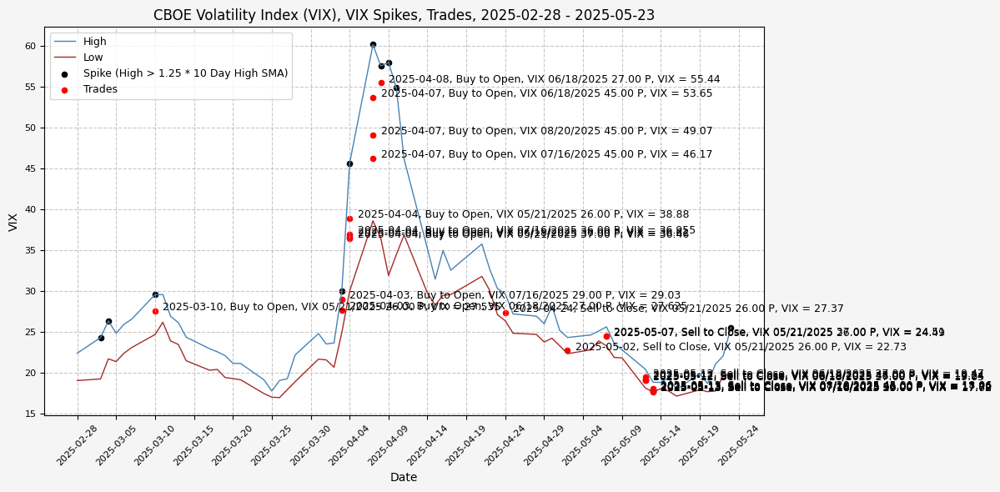

<!-- INSERT_13_Closed_Positions_HERE -->
<!-- INSERT_13_Open_Positions_HERE -->
<!-- INSERT_13_Total_Opened_Position_Market_Value_HERE -->
<!-- INSERT_13_Total_Closed_Position_Market_Value_HERE -->
<!-- INSERT_13_PnL_HERE -->
<!-- INSERT_13_Percent_PnL_HERE -->
✅ Exported and tracked: 13_Closed_Positions.md
✅ Exported and tracked: 13_Open_Positions.md
✅ Exported and tracked: 13_Total_Opened_Position_Market_Value.txt
✅ Exported and tracked: 13_Total_Closed_Position_Market_Value.txt
✅ Exported and tracked: 13_PnL.txt
✅ Exported and tracked: 13_Percent_PnL.txt


In [104]:
# Variables to be modifed
esd = "2025-05-21" # Expiration Start Date
eed = "2025-08-20" # Expiration End Date
tsd = "2025-03-10" # Trade Start Date
ted = "2025-05-13" # Trade End Date
index_number = "13"
x_tick_spacing = 5
y_tick_spacing = 5

############################################
## Do not modify the code below this line ##
############################################

trades, closed_pos, open_pos, per_pnl, pnl, tot_opened_pos_mkt_val, tot_closed_pos_mkt_val = calc_vix_trade_pnl(
    transaction_df=vix_transactions,
    exp_start_date=esd,
    exp_end_date=eed,
    trade_start_date=tsd,
    trade_end_date=ted,
)

# Convert to datetime objects
tsd_dt = datetime.strptime(tsd, "%Y-%m-%d")
ted_dt = datetime.strptime(ted, "%Y-%m-%d")

# Adjust the plot start and end dates
plot_start = tsd_dt - timedelta(days=10)
plot_end = ted_dt + timedelta(days=10)

plot_vix_with_trades(
    vix_price_df=vix,
    trades_df=trades,
    plot_start_date=plot_start.strftime("%Y-%m-%d"),
    plot_end_date=plot_end.strftime("%Y-%m-%d"),
    x_tick_spacing=x_tick_spacing,
    y_tick_spacing=y_tick_spacing,
    index_number=index_number,
    export_plot=True,
)

print(f"<!-- INSERT_{index_number}_Closed_Positions_HERE -->")
print(f"<!-- INSERT_{index_number}_Open_Positions_HERE -->")
print(f"<!-- INSERT_{index_number}_Total_Opened_Position_Market_Value_HERE -->")
print(f"<!-- INSERT_{index_number}_Total_Closed_Position_Market_Value_HERE -->")
print(f"<!-- INSERT_{index_number}_PnL_HERE -->")
print(f"<!-- INSERT_{index_number}_Percent_PnL_HERE -->")
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Closed_Positions.md", content=closed_pos.to_markdown(index=False, floatfmt=".2f"))
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Open_Positions.md", content=open_pos.to_markdown(index=False, floatfmt=".2f"))
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Total_Opened_Position_Market_Value.txt", content=tot_opened_pos_mkt_val)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Total_Closed_Position_Market_Value.txt", content=tot_closed_pos_mkt_val)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_PnL.txt", content=pnl)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Percent_PnL.txt", content=per_pnl)

#### Low Volatility In June, July, August, September, October, November 2025

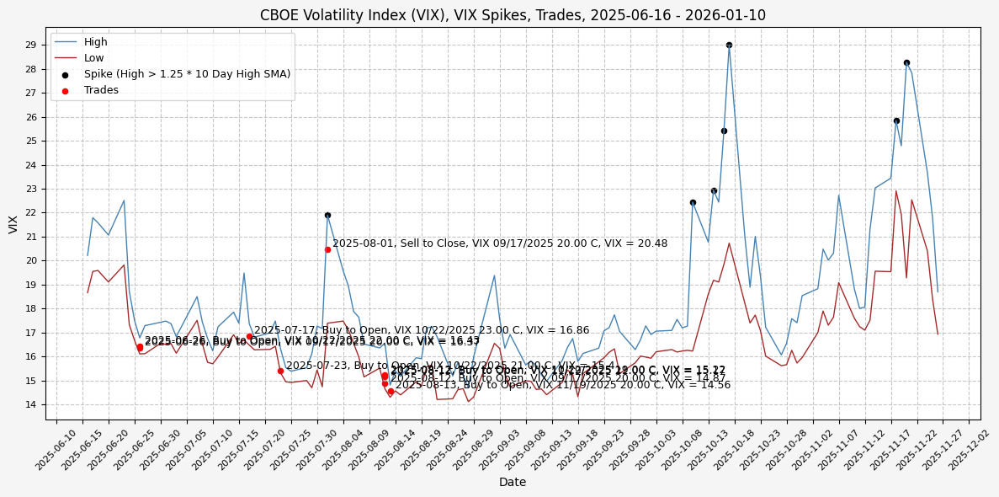

<!-- INSERT_14_Closed_Positions_HERE -->
<!-- INSERT_14_Open_Positions_HERE -->
<!-- INSERT_14_Total_Opened_Position_Market_Value_HERE -->
<!-- INSERT_14_Total_Closed_Position_Market_Value_HERE -->
<!-- INSERT_14_PnL_HERE -->
<!-- INSERT_14_Percent_PnL_HERE -->
✅ Exported and tracked: 14_Closed_Positions.md
✅ Exported and tracked: 14_Open_Positions.md
✅ Exported and tracked: 14_Total_Opened_Position_Market_Value.txt
✅ Exported and tracked: 14_Total_Closed_Position_Market_Value.txt
✅ Exported and tracked: 14_PnL.txt
✅ Exported and tracked: 14_Percent_PnL.txt


In [105]:
# Variables to be modifed
esd = "2025-09-17" # Expiration Start Date
eed = "2025-12-31" # Expiration End Date
tsd = "2025-06-26" # Trade Start Date
ted = "2025-12-31"  # Trade End Date
index_number = "14"
x_tick_spacing = 5
y_tick_spacing = 1

############################################
## Do not modify the code below this line ##
############################################

trades, closed_pos, open_pos, per_pnl, pnl, tot_opened_pos_mkt_val, tot_closed_pos_mkt_val = calc_vix_trade_pnl(
    transaction_df=vix_transactions,
    exp_start_date=esd,
    exp_end_date=eed,
    trade_start_date=tsd,
    trade_end_date=ted,
)

# Convert to datetime objects
tsd_dt = datetime.strptime(tsd, "%Y-%m-%d")
ted_dt = datetime.strptime(ted, "%Y-%m-%d")

# Adjust the plot start and end dates
plot_start = tsd_dt - timedelta(days=10)
plot_end = ted_dt + timedelta(days=10)

plot_vix_with_trades(
    vix_price_df=vix,
    trades_df=trades,
    plot_start_date=plot_start.strftime("%Y-%m-%d"),
    plot_end_date=plot_end.strftime("%Y-%m-%d"),
    x_tick_spacing=x_tick_spacing,
    y_tick_spacing=y_tick_spacing,
    index_number=index_number,
    export_plot=True,
)

print(f"<!-- INSERT_{index_number}_Closed_Positions_HERE -->")
print(f"<!-- INSERT_{index_number}_Open_Positions_HERE -->")
print(f"<!-- INSERT_{index_number}_Total_Opened_Position_Market_Value_HERE -->")
print(f"<!-- INSERT_{index_number}_Total_Closed_Position_Market_Value_HERE -->")
print(f"<!-- INSERT_{index_number}_PnL_HERE -->")
print(f"<!-- INSERT_{index_number}_Percent_PnL_HERE -->")
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Closed_Positions.md", content=closed_pos.to_markdown(index=False, floatfmt=".2f"))
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Open_Positions.md", content=open_pos.to_markdown(index=False, floatfmt=".2f"))
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Total_Opened_Position_Market_Value.txt", content=tot_opened_pos_mkt_val)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Total_Closed_Position_Market_Value.txt", content=tot_closed_pos_mkt_val)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_PnL.txt", content=pnl)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Percent_PnL.txt", content=per_pnl)

#### Complete Trade History

In [106]:
# Variables to be modifed
esd = None
eed = None
tsd = None
ted = None
index_number = "99"

############################################
## Do not modify the code below this line ##
############################################

trades, closed_pos, open_pos, per_pnl, pnl, tot_opened_pos_mkt_val, tot_closed_pos_mkt_val = calc_vix_trade_pnl(
    transaction_df=vix_transactions,
    exp_start_date=esd,
    exp_end_date=eed,
    trade_start_date=tsd,
    trade_end_date=ted,
)

print(f"<!-- INSERT_{index_number}_Closed_Positions_HERE -->")
print(f"<!-- INSERT_{index_number}_Open_Positions_HERE -->")
print(f"<!-- INSERT_{index_number}_Total_Opened_Position_Market_Value_HERE -->")
print(f"<!-- INSERT_{index_number}_Total_Closed_Position_Market_Value_HERE -->")
print(f"<!-- INSERT_{index_number}_PnL_HERE -->")
print(f"<!-- INSERT_{index_number}_Percent_PnL_HERE -->")
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Closed_Positions.md", content=closed_pos.to_markdown(index=False, floatfmt=".2f"))
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Open_Positions.md", content=open_pos.to_markdown(index=False, floatfmt=".2f"))
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Total_Opened_Position_Market_Value.txt", content=tot_opened_pos_mkt_val)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Total_Closed_Position_Market_Value.txt", content=tot_closed_pos_mkt_val)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_PnL.txt", content=pnl)
export_track_md_deps(dep_file=dep_file, md_filename=f"{index_number}_Percent_PnL.txt", content=per_pnl)

<!-- INSERT_99_Closed_Positions_HERE -->
<!-- INSERT_99_Open_Positions_HERE -->
<!-- INSERT_99_Total_Opened_Position_Market_Value_HERE -->
<!-- INSERT_99_Total_Closed_Position_Market_Value_HERE -->
<!-- INSERT_99_PnL_HERE -->
<!-- INSERT_99_Percent_PnL_HERE -->
✅ Exported and tracked: 99_Closed_Positions.md
✅ Exported and tracked: 99_Open_Positions.md
✅ Exported and tracked: 99_Total_Opened_Position_Market_Value.txt
✅ Exported and tracked: 99_Total_Closed_Position_Market_Value.txt
✅ Exported and tracked: 99_PnL.txt
✅ Exported and tracked: 99_Percent_PnL.txt
